In [1]:
#%pip install -q -r ../requirements.txt

In [2]:
#%pip install -q tensorflow tensorflow_hub tensorflow_text

In [3]:
#import os
#import certifi

# if problems with SSL occur, upgrade certifi and run this cell (worked for me)
#os.environ["SSL_CERT_FILE"] = certifi.where()


In [4]:
import implementation_approach_3 as impl

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Topic modelling on Description

Loading AG-News dataset...
--- Loading and Preparing Data ---
SHAPE train  (120000, 3)
SHAPE test  (7600, 3)
TRAIN Cols  Index(['Class Index', 'Title', 'Description'], dtype='object')
TRAIN LABELS  labels
1    30000
2    30000
3    30000
4    30000
Name: count, dtype: int64
TEST LABELS  labels
1    1900
2    1900
3    1900
4    1900
Name: count, dtype: int64
Index(['labels', 'Title', 'Description'], dtype='object')
SUBSAMPLING
(20000, 3)
Training data shape: (20000, 4)
training data cols:  Index(['labels', 'Title', 'Description', 'Combined'], dtype='object')
Test data shape: (4000, 4)
testing data cols:  Index(['labels', 'Title', 'Description', 'Combined'], dtype='object')
Label distribution in training: {2: 5000, 3: 5000, 1: 5000, 4: 5000}
Loading and preprocessing AG-News data...
train df  (20000, 4)
test df  (4000, 4)
LABELS are:
{0, 1, 2, 3}
Generating embeddings for optimal k calculation...
Finding optimal number of clusters using Elbow method...
Elbow method suggests k = 4
Best s

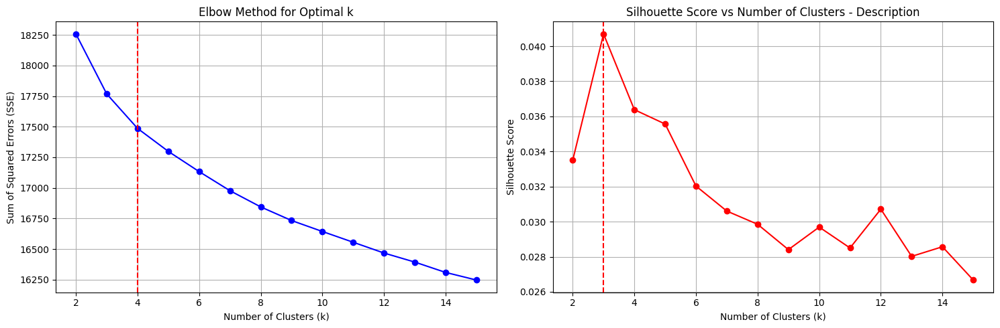

Loaded 20000 training texts and 4000 test texts
Categories distribution: Counter({1: 5000, 2: 5000, 0: 5000, 3: 5000})
weekend sees "other showdown between new york new england jets patriots clash battle unbeaten teams.


In [5]:
tm = impl.AGNewsTopicModeling()
tm.load_data(column='Description')
print(tm.processed_texts[0])



=== Run Transformer-based Topic Modeling (Bertopic) ===
Testing all-MiniLM-L12-v2...

=== Running BERTopic all-MiniLM-L12-v2 ===


2025-06-24 12:28:58,124 - BERTopic - Embedding - Transforming documents to embeddings.


Fitting BERTopic all-MiniLM-L12-v2 model...


Batches: 100%|██████████| 625/625 [00:12<00:00, 48.96it/s]
2025-06-24 12:29:11,009 - BERTopic - Embedding - Completed ✓
2025-06-24 12:29:11,010 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-06-24 12:29:23,761 - BERTopic - Dimensionality - Completed ✓
2025-06-24 12:29:23,762 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-06-24 12:30:39,669 - BERTopic - Cluster - Completed ✓
2025-06-24 12:30:39,670 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-06-24 12:30:39,937 - BERTopic - Representation - Completed ✓
2025-06-24 12:30:39,938 - BERTopic - Topic reduction - Reducing number of topics
2025-06-24 12:30:39,969 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-06-24 12:30:40,185 - BERTopic - Representation - Completed ✓
2025-06-24 12:30:40,190 - BERTopic - Topic reduction - Reduced number of topics from 364 to 5
Batches: 100%|██████████| 125/125 [00:02<00:00, 46

Predicted topic counts (train): Counter({0: 6248, -1: 5383, 1: 4518, 2: 2969, 3: 882})
Predicted topic counts (test): [0, 1, 1, 0, 2, 0, -1, 1, 2, 2, 1, 1, -1, 0, -1, 2, 0, 0, -1, 0, -1, -1, 3, -1, 0, 1, -1, 0, 2, -1, -1, 1, 1, -1, 1, -1, -1, 1, 0, 0, 0, 2, 1, 0, -1, 0, 0, 3, -1, 2, -1, 2, 0, -1, 2, -1, 0, 0, 1, 1, -1, 0, 2, 0, 1, 2, 0, -1, 1, 1, 0, -1, 1, 0, 2, -1, -1, 2, 3, -1, 3, 1, 2, 1, 0, 0, 2, 1, -1, -1, -1, 2, 1, 2, -1, -1, 0, -1, -1, -1, 1, 2, 2, -1, 1, 2, 2, 0, -1, -1, -1, 0, -1, -1, 1, 0, 1, 0, 1, -1, 1, -1, -1, 2, 3, -1, -1, 2, 2, 1, 2, 1, -1, 1, -1, 0, -1, -1, 2, 1, 1, -1, -1, -1, 1, 0, 1, -1, 0, -1, 0, 0, 2, 0, -1, 1, -1, 0, 2, 0, -1, -1, 0, 1, 1, 1, 0, -1, -1, 1, -1, 0, 1, -1, 0, -1, 2, 1, 1, 2, 1, -1, 0, 0, 2, 0, 3, -1, 1, -1, 0, 0, 0, 3, -1, -1, 1, 0, 2, -1, -1, -1, 3, 1, 2, -1, -1, 2, 0, 1, -1, 2, 1, -1, 3, 2, 0, 2, 3, -1, 1, -1, -1, 0, -1, 1, 0, -1, 0, -1, 1, 0, 2, 1, -1, 0, 1, 1, 1, -1, -1, 0, -1, -1, 0, 3, 1, -1, 0, 1, 1, -1, 2, -1, 0, 2, -1, 3, -1, 0, 2, -1, -1, -

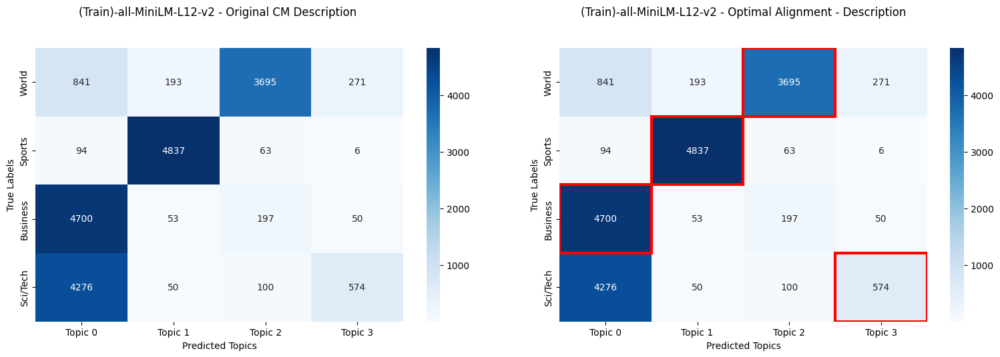


(Test)-all-MiniLM-L12-v2 Performance:
ARI: 0.4626
NMI: 0.5094
Homogeneity: 0.4708
Completeness: 0.5548
V-Measure: 0.5094
Aligned_Accuracy: 0.6760
Macro_F1: 0.6403
Weighted_F1: 0.6403

Optimal Topic-Label Alignment:
Topic 2 -> World (713 samples)
Topic 1 -> Sports (937 samples)
Topic 0 -> Business (917 samples)
Topic 3 -> Sci/Tech (137 samples)


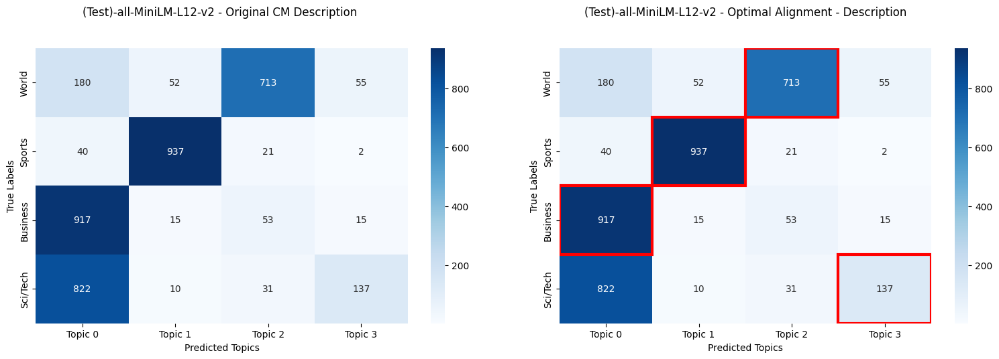

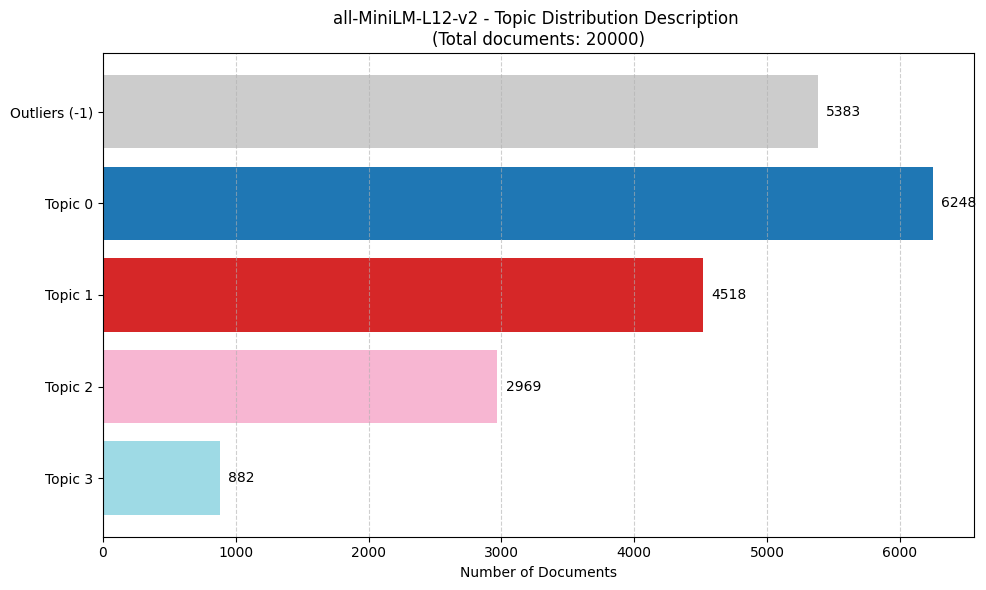

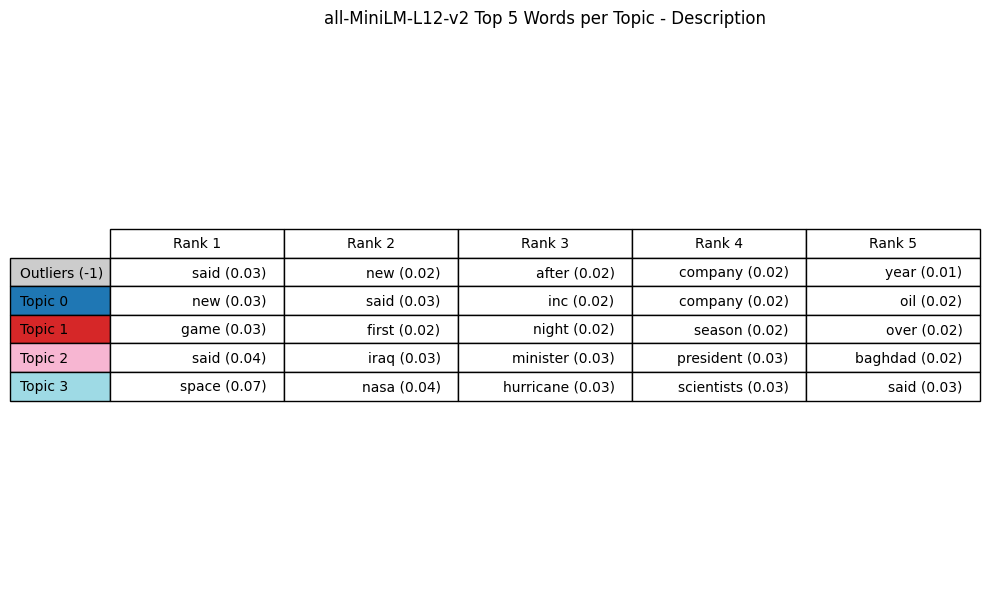

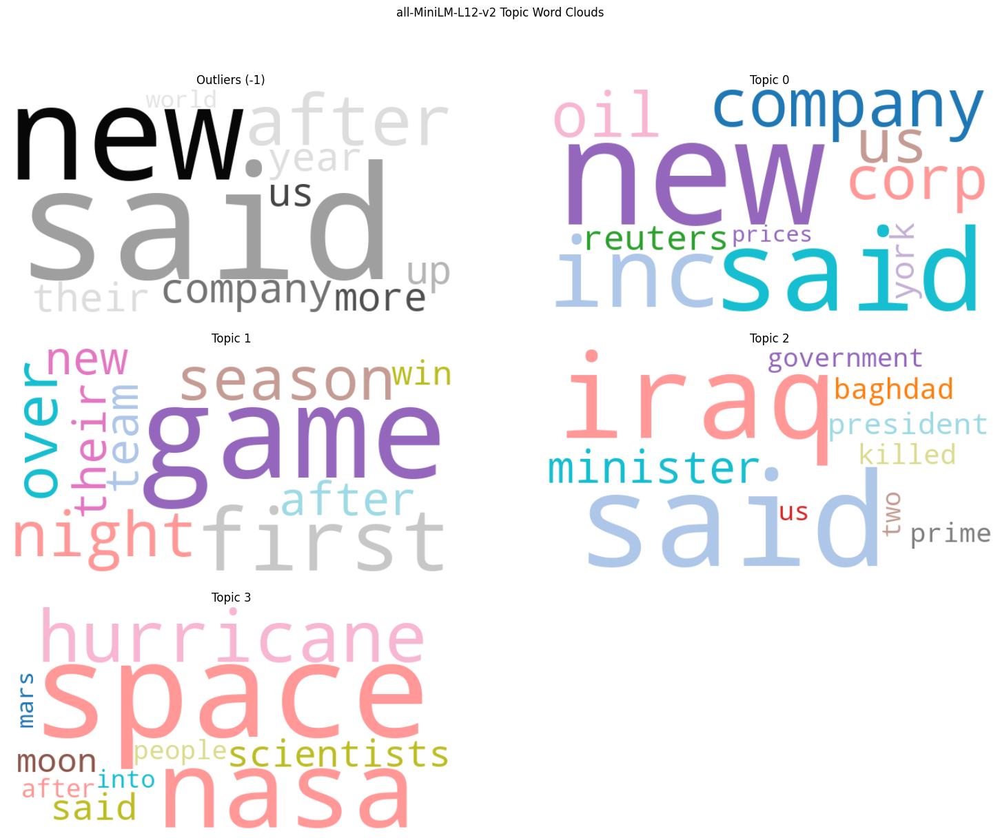

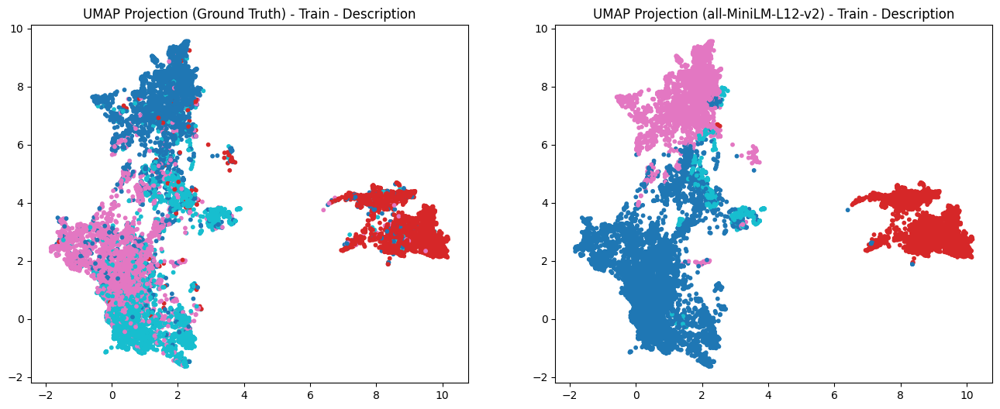

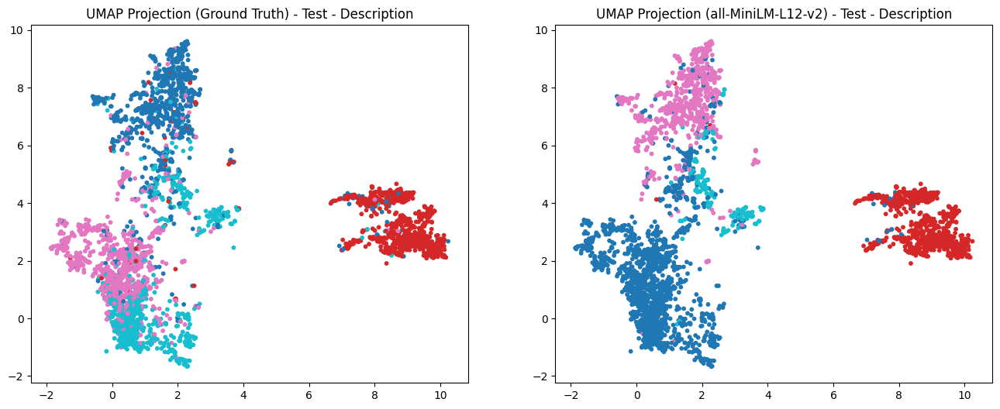


Top words per topic:
   Topic  Count                               Name  \
0     -1   5383          -1_said_new_after_company   
1      0   6248             0_new_said_inc_company   
2      1   4518          1_game_first_night_season   
3      2   2969     2_said_iraq_minister_president   
4      3    882  3_space_nasa_hurricane_scientists   

                                      Representation  \
0  [said, new, after, company, year, their, us, u...   
1  [new, said, inc, company, oil, corp, us, reute...   
2  [game, first, night, season, over, after, thei...   
3  [said, iraq, minister, president, baghdad, kil...   
4  [space, nasa, hurricane, scientists, said, moo...   

                                 Representative_Docs  
0  [microsystems microsoft next month plan reveal...  
1  [los angeles (reuters) first-day sales microso...  
2  [first time they met last season, new england ...  
3  [baghdad, iraq car bomb exploded town south ba...  
4  [blaming busy hurricane season, nasa a

2025-06-24 12:31:30,105 - BERTopic - Embedding - Transforming documents to embeddings.


Fitting BERTopic all-mpnet-base-v2 model...


Batches: 100%|██████████| 625/625 [00:38<00:00, 16.18it/s]
2025-06-24 12:32:08,860 - BERTopic - Embedding - Completed ✓
2025-06-24 12:32:08,861 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-06-24 12:32:16,217 - BERTopic - Dimensionality - Completed ✓
2025-06-24 12:32:16,218 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-06-24 12:33:41,362 - BERTopic - Cluster - Completed ✓
2025-06-24 12:33:41,363 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-06-24 12:33:41,635 - BERTopic - Representation - Completed ✓
2025-06-24 12:33:41,635 - BERTopic - Topic reduction - Reducing number of topics
2025-06-24 12:33:41,657 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-06-24 12:33:41,807 - BERTopic - Representation - Completed ✓
2025-06-24 12:33:41,811 - BERTopic - Topic reduction - Reduced number of topics from 397 to 5
Batches: 100%|██████████| 125/125 [00:07<00:00, 16

Predicted topic counts (train): Counter({0: 5877, -1: 5049, 1: 4520, 2: 3542, 3: 1012})
Predicted topic counts (test): [2, -1, 1, 0, 2, 3, -1, 1, -1, 1, 1, -1, -1, 0, 1, 2, 0, 0, -1, 0, 0, 0, 3, -1, 2, 1, 0, -1, 2, 0, 0, 1, 1, -1, -1, 2, 3, 1, 2, 0, -1, 2, 1, 0, 0, 0, 0, 3, -1, 2, -1, 2, 3, 2, 2, 0, -1, 0, 1, 1, 2, 0, 2, 0, 1, -1, 0, 2, 1, 1, 0, 0, 1, -1, -1, -1, 2, -1, 3, 2, -1, 1, 2, 1, 0, 0, -1, 1, 2, -1, -1, 2, 1, 2, 2, -1, -1, -1, 3, -1, 1, -1, 2, -1, 1, 2, 2, 0, 0, -1, -1, 0, -1, 1, 1, 0, 1, -1, -1, 0, 1, 0, -1, 2, -1, -1, -1, -1, -1, -1, 2, 1, -1, 1, 2, 0, -1, -1, 2, 1, 1, -1, 3, -1, 1, -1, 2, 3, 0, 2, -1, 0, 2, 0, -1, 1, -1, 0, 2, 0, 0, 0, 0, 1, -1, 1, 0, 0, 0, 1, 2, -1, 1, -1, 0, -1, 2, 1, 2, 2, -1, 0, 0, 0, 2, -1, 2, 2, 2, 0, 0, -1, -1, -1, 0, -1, 0, 0, -1, 2, 2, -1, 3, -1, 2, -1, 0, 2, 0, -1, 1, 2, -1, -1, 0, -1, 0, 2, 3, -1, -1, 2, -1, 2, 0, 1, 0, 0, 0, -1, 1, 3, 2, 1, 1, -1, 1, 1, 1, 0, -1, 2, -1, 1, 0, 3, 1, -1, 0, 1, -1, -1, -1, -1, -1, 2, 2, 3, -1, 0, 2, 0, -1, -1, 0, 0

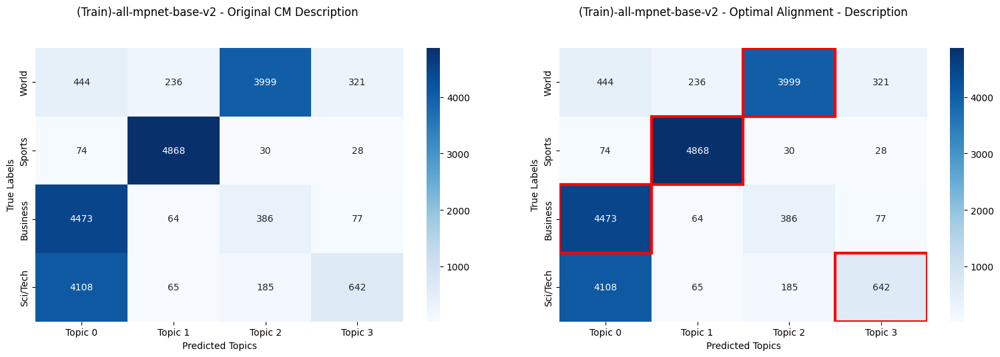


(Test)-all-mpnet-base-v2 Performance:
ARI: 0.4917
NMI: 0.5095
Homogeneity: 0.4771
Completeness: 0.5467
V-Measure: 0.5095
Aligned_Accuracy: 0.6810
Macro_F1: 0.6416
Weighted_F1: 0.6416

Optimal Topic-Label Alignment:
Topic 2 -> World (781 samples)
Topic 1 -> Sports (937 samples)
Topic 0 -> Business (875 samples)
Topic 3 -> Sci/Tech (131 samples)


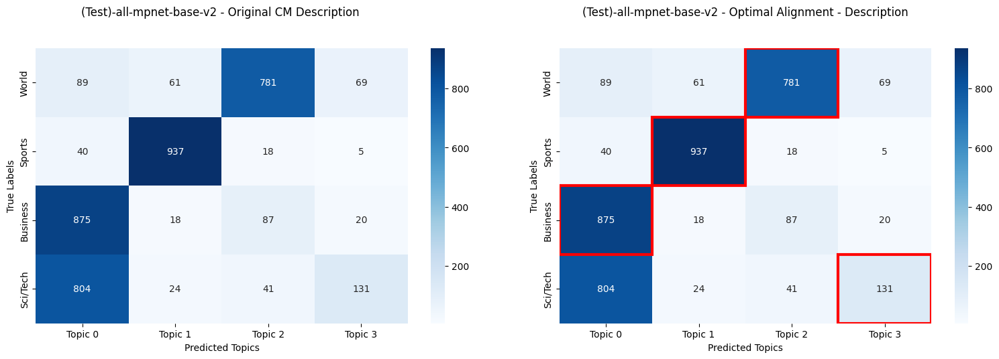

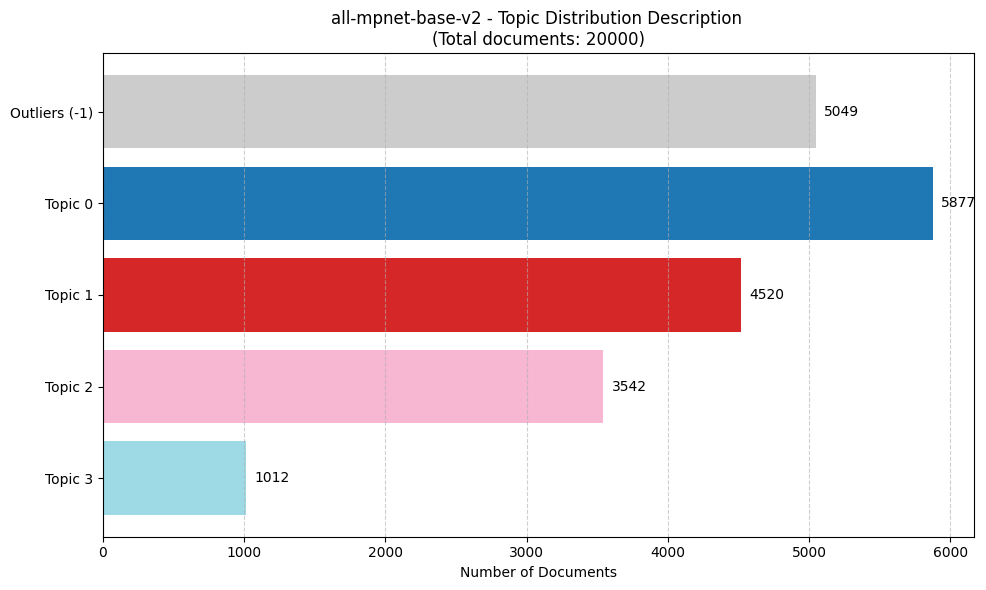

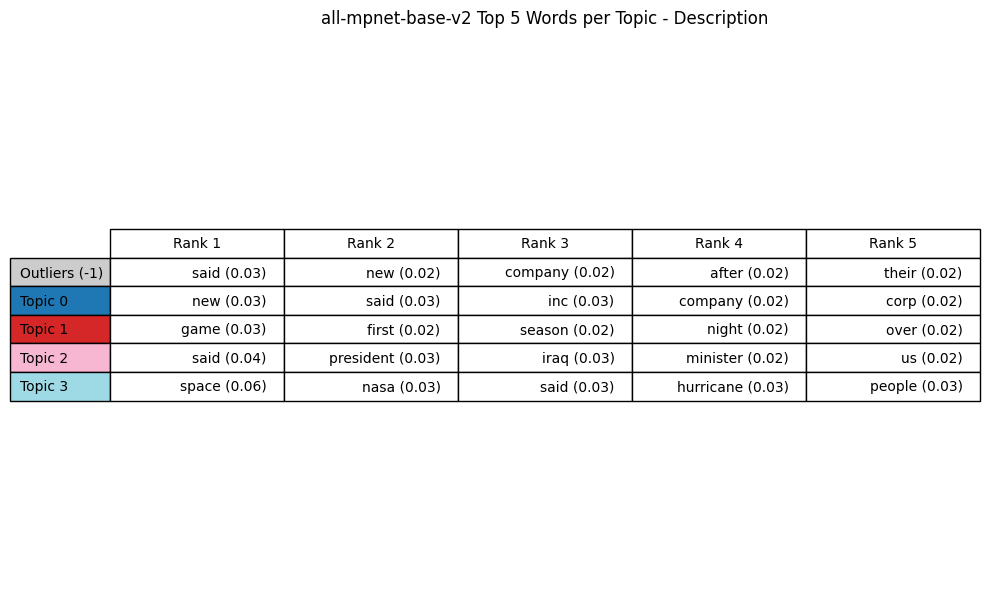

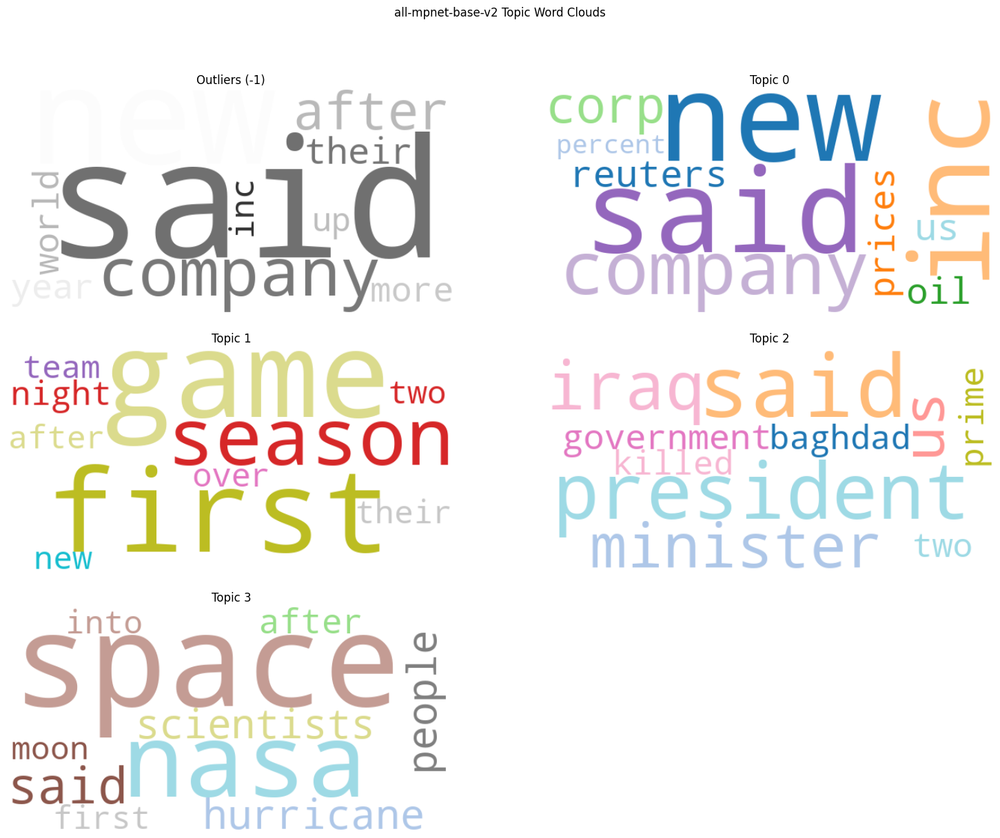

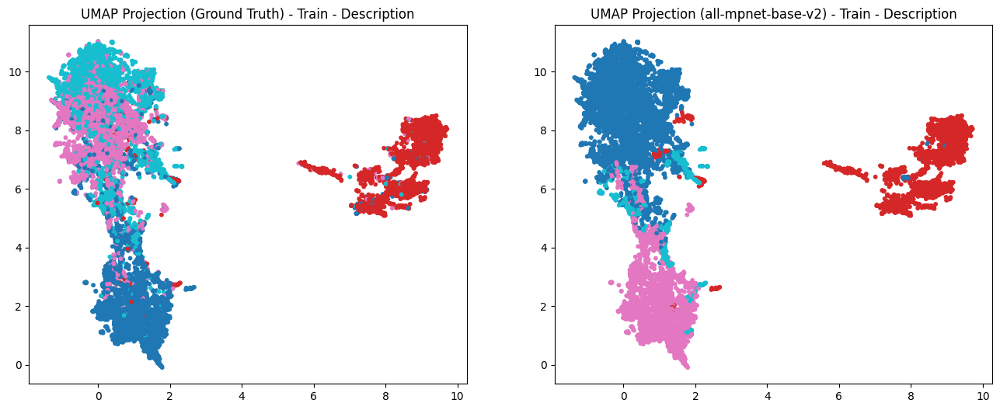

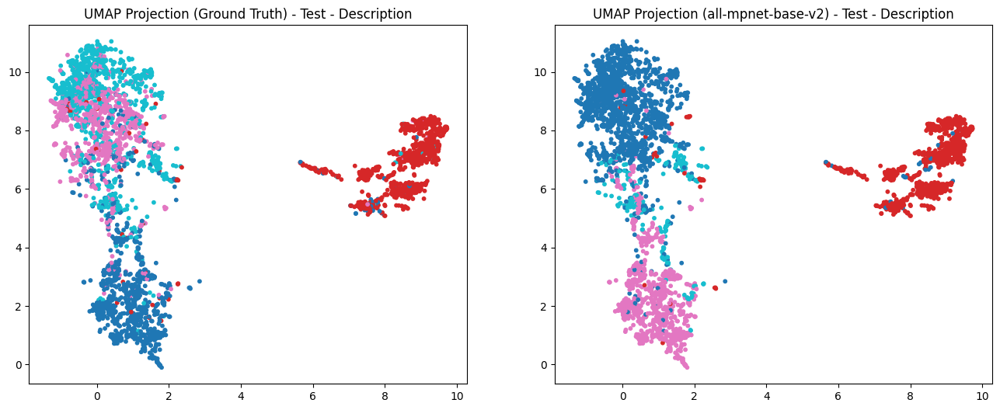


Top words per topic:
   Topic  Count                            Name  \
0     -1   5049       -1_said_new_company_after   
1      0   5877          0_new_said_inc_company   
2      1   4520       1_game_first_season_night   
3      2   3542  2_said_president_iraq_minister   
4      3   1012     3_space_nasa_said_hurricane   

                                      Representation  \
0  [said, new, company, after, their, year, world...   
1  [new, said, inc, company, corp, reuters, us, o...   
2  [game, first, season, night, over, after, new,...   
3  [said, president, iraq, minister, us, governme...   
4  [space, nasa, said, hurricane, people, scienti...   

                                 Representative_Docs  
0  [kimberly-clark corp. said aims cut costs \$40...  
1  [los angeles (reuters) first-day sales microso...  
2  [phoenix (sports network) randy johnson became...  
3  [body egyptian who was\kidnapped iraq last mon...  
4  [spaceshipone, world 's first privately funded...  

Top

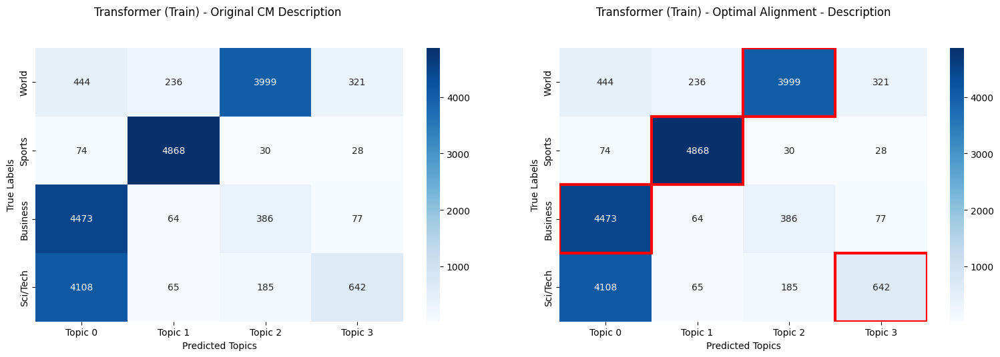


Transformer (Test) Performance:
ARI: 0.4917
NMI: 0.5095
Homogeneity: 0.4771
Completeness: 0.5467
V-Measure: 0.5095
Aligned_Accuracy: 0.6810
Macro_F1: 0.6416
Weighted_F1: 0.6416

Optimal Topic-Label Alignment:
Topic 2 -> World (781 samples)
Topic 1 -> Sports (937 samples)
Topic 0 -> Business (875 samples)
Topic 3 -> Sci/Tech (131 samples)


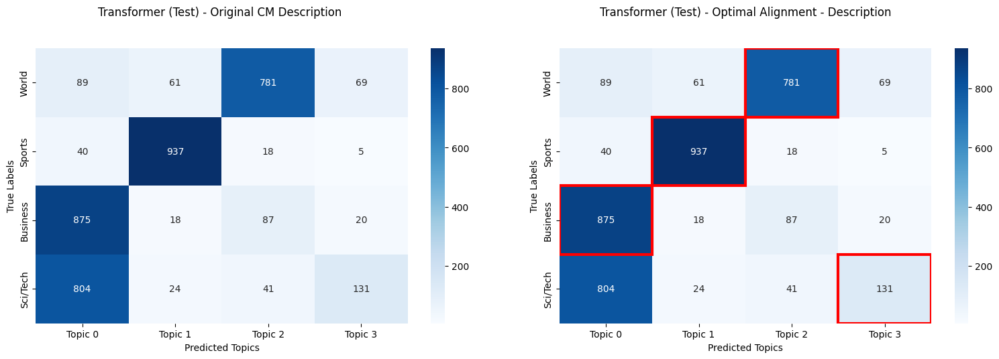

In [6]:
tm.run_transformer_topic_modeling()

2025-06-24 12:35:03,073 - top2vec - INFO - Pre-processing documents for training



=== Running Top2Vec for Exploration ===
Training Top2Vec on 20000 documents...


2025-06-24 12:35:03,638 - top2vec - INFO - Downloading universal-sentence-encoder model
2025-06-24 12:35:07,442 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2025-06-24 12:35:08,383 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2025-06-24 12:35:15,092 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2025-06-24 12:35:15,295 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


Top2Vec found 315 topics
Before reduction: 315
After reduction: 4
Reduction result: [[90, 273, 306, 170, 197, 82, 304, 134, 99, 265, 295, 130, 289, 206, 275, 267, 9, 172, 268, 70, 44, 61, 155, 178, 111, 175, 108, 147, 143, 46, 106, 231, 7, 93, 233, 160, 81, 207, 256, 264, 8, 194, 200, 154, 137, 109, 131, 284, 226, 55, 101, 140, 50, 138, 215, 113, 59, 185, 203, 222, 67, 37, 243, 88, 83, 230, 266, 307, 119, 64, 76, 158, 294, 299, 72, 184, 176, 29, 247, 96, 196, 11, 14, 20, 254, 283, 118, 165, 36, 259, 127, 23, 285, 107, 214, 202, 174, 58, 51, 121, 193, 21, 199, 122, 145, 144, 39, 146, 22], [182, 110, 135, 68, 238, 237, 225, 156, 84, 223, 41, 210, 91, 141, 26, 112, 1, 33, 80, 17, 286, 43, 87, 53, 116, 297, 287, 16, 277, 120, 4, 3, 139, 292, 191, 73, 152, 126, 132, 27, 219, 229, 235, 6, 2, 249, 0], [228, 262, 103, 239, 151, 241, 253, 159, 216, 242, 261, 60, 298, 28, 258, 124, 181, 5, 133, 248, 224, 269, 293, 250, 157, 31, 303, 276, 244, 280, 211, 192, 301, 221, 204, 288, 180, 232, 164, 115

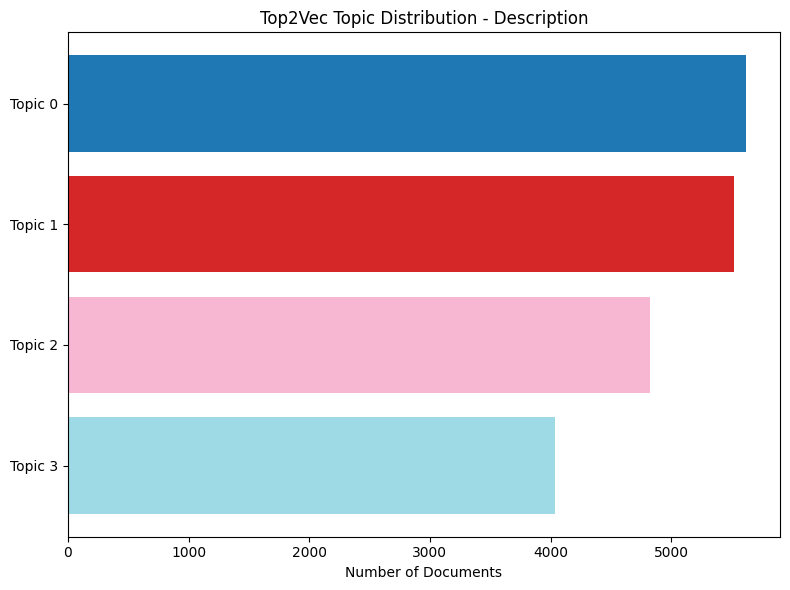

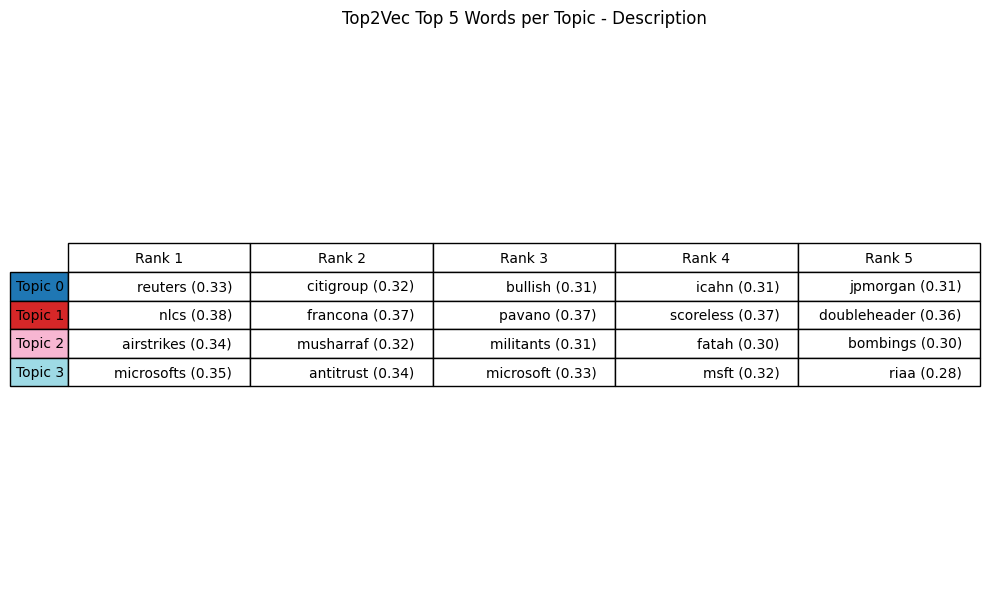

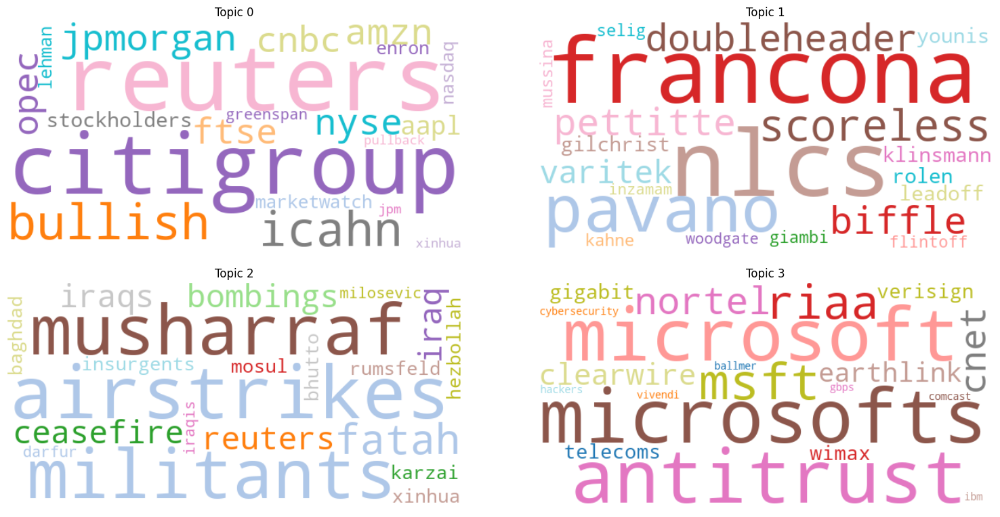


Top2Vec (Train) Performance:
ARI: 0.6121
NMI: 0.5875
Homogeneity: 0.5858
Completeness: 0.5893
V-Measure: 0.5875
Aligned_Accuracy: 0.8273
Macro_F1: 0.8251
Weighted_F1: 0.8251

Optimal Topic-Label Alignment:
Topic 2 -> World (4238 samples)
Topic 1 -> Sports (4869 samples)
Topic 0 -> Business (4072 samples)
Topic 3 -> Sci/Tech (3366 samples)


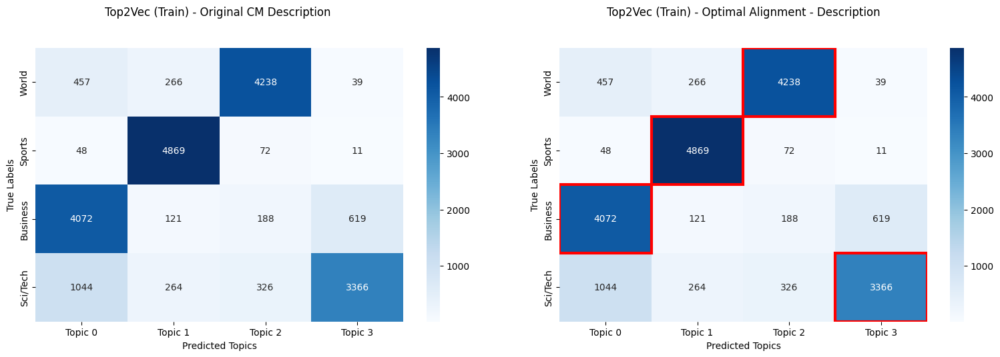


Evaluating on test set...

Top2Vec (Test) Performance:
ARI: 0.5511
NMI: 0.5575
Homogeneity: 0.5537
Completeness: 0.5614
V-Measure: 0.5575
Aligned_Accuracy: 0.7945
Macro_F1: 0.7961
Weighted_F1: 0.7961

Optimal Topic-Label Alignment:
Topic 2 -> World (773 samples)
Topic 1 -> Sports (953 samples)
Topic 0 -> Business (808 samples)
Topic 3 -> Sci/Tech (644 samples)


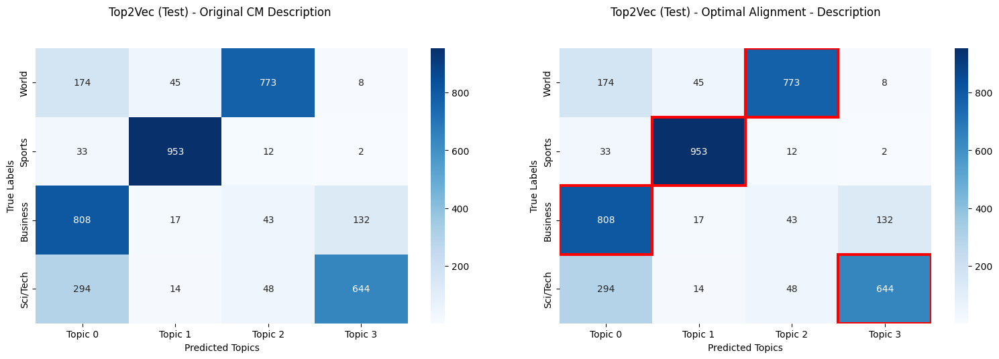


Test Set Assignment Quality:
Assigned documents: 4000/4000
Mean assignment score: 0.59
Median assignment score: 0.60


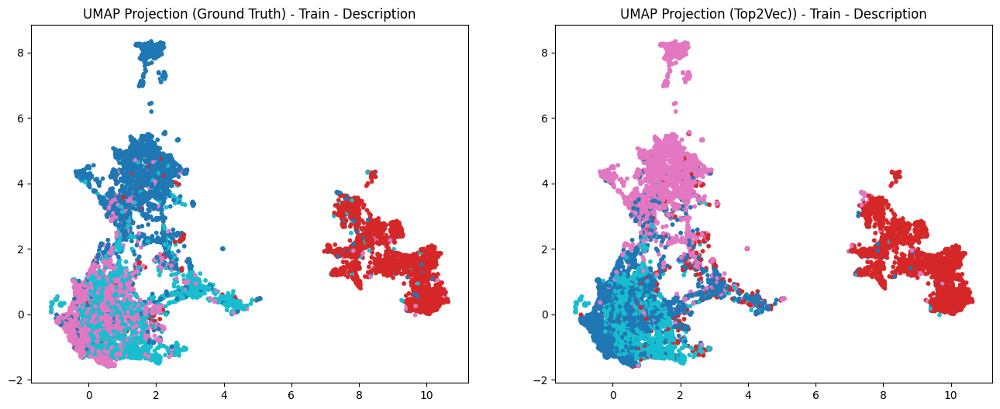

In [7]:
tm.run_top2vec()


=== Running Ensemble Methods ===
Ensembling 2 models: ['Transformer', 'Top2Vec']

Ensemble (Train) Performance:
ARI: 0.5344
NMI: 0.5659
Homogeneity: 0.5286
Completeness: 0.6089
V-Measure: 0.5659
Aligned_Accuracy: 0.6991
Macro_F1: 0.6577
Weighted_F1: 0.6577

Optimal Topic-Label Alignment:
Topic 2 -> World (3999 samples)
Topic 1 -> Sports (4868 samples)
Topic 0 -> Business (4473 samples)
Topic 3 -> Sci/Tech (642 samples)


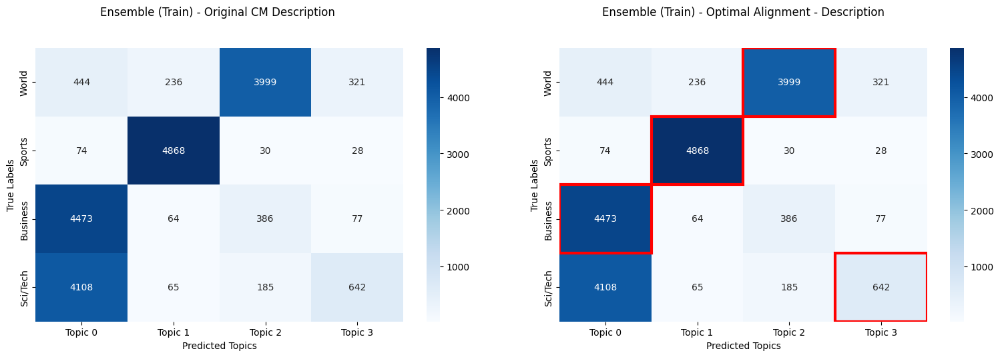


Ensemble (Test) Performance:
ARI: 0.4917
NMI: 0.5095
Homogeneity: 0.4771
Completeness: 0.5467
V-Measure: 0.5095
Aligned_Accuracy: 0.6810
Macro_F1: 0.6416
Weighted_F1: 0.6416

Optimal Topic-Label Alignment:
Topic 2 -> World (781 samples)
Topic 1 -> Sports (937 samples)
Topic 0 -> Business (875 samples)
Topic 3 -> Sci/Tech (131 samples)


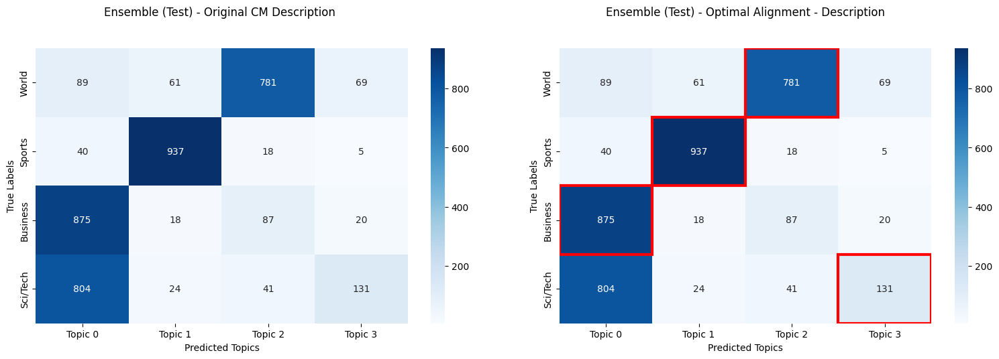

In [8]:
tm.run_ensemble_methods()


FINAL PERFORMANCE COMPARISON

Test Set Performance Comparison:
                 Model    ARI    NMI  Homogeneity  Completeness  V-Measure  Aligned_Accuracy  Macro_F1  Weighted_F1
BERT_all-MiniLM-L12-v2 0.4626 0.5094       0.4708        0.5548     0.5094            0.6760    0.6403       0.6403
BERT_all-mpnet-base-v2 0.4917 0.5095       0.4771        0.5467     0.5095            0.6810    0.6416       0.6416
               Top2Vec 0.5511 0.5575       0.5537        0.5614     0.5575            0.7945    0.7961       0.7961
              Ensemble 0.4917 0.5095       0.4771        0.5467     0.5095            0.6810    0.6416       0.6416

----------------------------------------
BEST PERFORMING MODELS:
----------------------------------------
ARI: Top2Vec (0.5511)
NMI: Top2Vec (0.5575)
Homogeneity: Top2Vec (0.5537)
Completeness: Top2Vec (0.5614)
V-Measure: Top2Vec (0.5575)
Aligned_Accuracy: Top2Vec (0.7945)


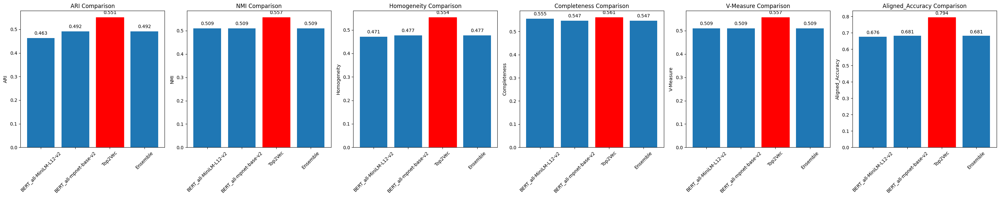

In [9]:
tm.generate_final_comparison()

### Topic modelling on Title

Loading AG-News dataset...
--- Loading and Preparing Data ---
SHAPE train  (120000, 3)
SHAPE test  (7600, 3)
TRAIN Cols  Index(['Class Index', 'Title', 'Description'], dtype='object')
TRAIN LABELS  labels
1    30000
2    30000
3    30000
4    30000
Name: count, dtype: int64
TEST LABELS  labels
1    1900
2    1900
3    1900
4    1900
Name: count, dtype: int64
Index(['labels', 'Title', 'Description'], dtype='object')
SUBSAMPLING
(20000, 3)
Training data shape: (20000, 4)
training data cols:  Index(['labels', 'Title', 'Description', 'Combined'], dtype='object')
Test data shape: (4000, 4)
testing data cols:  Index(['labels', 'Title', 'Description', 'Combined'], dtype='object')
Label distribution in training: {2: 5000, 3: 5000, 1: 5000, 4: 5000}
Loading and preprocessing AG-News data...
train df  (20000, 4)
test df  (4000, 4)
LABELS are:
{0, 1, 2, 3}
Generating embeddings for optimal k calculation...
Finding optimal number of clusters using Elbow method...
Elbow method suggests k = 4
Best s

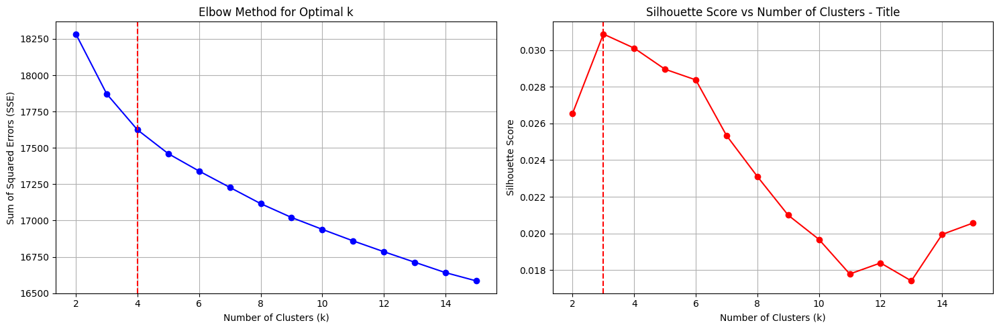

Loaded 20000 training texts and 4000 test texts
Categories distribution: Counter({1: 5000, 2: 5000, 0: 5000, 3: 5000})
baseball: jets flying


In [10]:
tm = impl.AGNewsTopicModeling()
tm.load_data(column='Title')
print(tm.processed_texts[0])


=== Run Transformer-based Topic Modeling (Bertopic) ===
Testing all-MiniLM-L12-v2...

=== Running BERTopic all-MiniLM-L12-v2 ===


2025-06-24 12:37:49,132 - BERTopic - Embedding - Transforming documents to embeddings.


Fitting BERTopic all-MiniLM-L12-v2 model...


Batches: 100%|██████████| 625/625 [00:06<00:00, 99.17it/s] 
2025-06-24 12:37:55,498 - BERTopic - Embedding - Completed ✓
2025-06-24 12:37:55,498 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-06-24 12:38:01,914 - BERTopic - Dimensionality - Completed ✓
2025-06-24 12:38:01,915 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-06-24 12:39:12,003 - BERTopic - Cluster - Completed ✓
2025-06-24 12:39:12,004 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-06-24 12:39:12,183 - BERTopic - Representation - Completed ✓
2025-06-24 12:39:12,184 - BERTopic - Topic reduction - Reducing number of topics
2025-06-24 12:39:12,201 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-06-24 12:39:12,276 - BERTopic - Representation - Completed ✓
2025-06-24 12:39:12,281 - BERTopic - Topic reduction - Reduced number of topics from 439 to 5
Batches: 100%|██████████| 125/125 [00:01<00:00, 9

Predicted topic counts (train): Counter({-1: 7170, 0: 5325, 1: 4205, 2: 2934, 3: 366})
Predicted topic counts (test): [-1, 1, 1, 0, -1, 2, -1, 1, -1, 1, 1, -1, 0, 0, 1, 2, 0, -1, -1, 0, 0, 1, 2, 2, 1, 1, -1, -1, 2, 0, 0, -1, -1, -1, 1, -1, 2, -1, 2, -1, 0, -1, -1, -1, 0, -1, 0, 3, -1, 2, -1, 2, -1, -1, 2, -1, -1, 0, 1, -1, -1, 0, 2, -1, 2, 2, 0, -1, 1, -1, 0, 0, -1, 0, 2, -1, 2, -1, 2, -1, 1, -1, 2, 1, -1, 0, -1, -1, -1, -1, -1, 2, 0, 2, 2, -1, -1, 1, 0, 2, -1, -1, -1, 0, 1, 2, 2, 0, -1, -1, -1, -1, 0, 1, 1, -1, 1, -1, 1, -1, 1, -1, 0, 2, 1, 0, 2, -1, 2, 1, 2, -1, 1, -1, -1, 0, 0, -1, 2, -1, 1, -1, 2, -1, -1, 0, 2, 0, -1, 2, -1, 1, -1, 1, -1, -1, 0, 1, 2, 1, 0, 0, -1, -1, 1, 1, 0, 0, -1, 1, 2, 0, -1, 0, 0, 1, 2, -1, -1, 2, 1, 0, 0, 0, 2, 0, 2, -1, 2, 0, 0, 1, -1, -1, 0, -1, 2, 0, -1, -1, 2, -1, 3, -1, 2, 2, -1, 2, 0, -1, 1, 0, -1, 0, 3, -1, -1, 2, 3, 0, -1, 2, -1, 0, 0, -1, 1, -1, 0, -1, -1, -1, -1, 1, 1, 0, 1, 1, -1, 0, 2, 2, 1, -1, 0, 1, 1, 1, -1, 1, 1, -1, 1, 2, 1, 2, -1, 2, 1, 0, 2

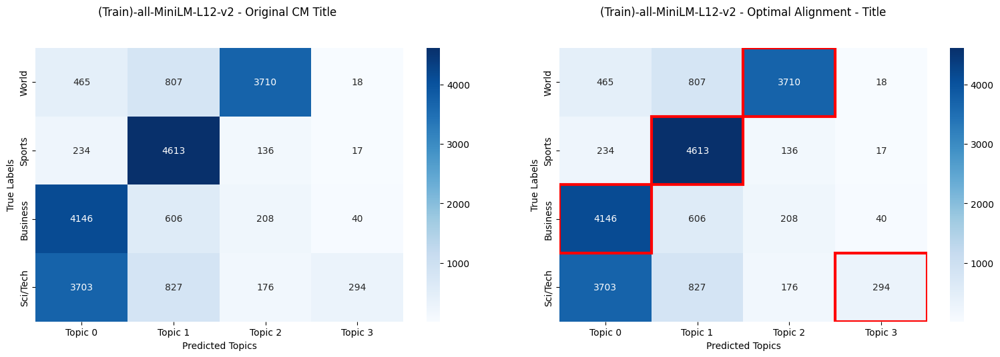


(Test)-all-MiniLM-L12-v2 Performance:
ARI: 0.3748
NMI: 0.3752
Homogeneity: 0.3447
Completeness: 0.4116
V-Measure: 0.3752
Aligned_Accuracy: 0.6298
Macro_F1: 0.5742
Weighted_F1: 0.5742

Optimal Topic-Label Alignment:
Topic 2 -> World (737 samples)
Topic 1 -> Sports (895 samples)
Topic 0 -> Business (807 samples)
Topic 3 -> Sci/Tech (80 samples)


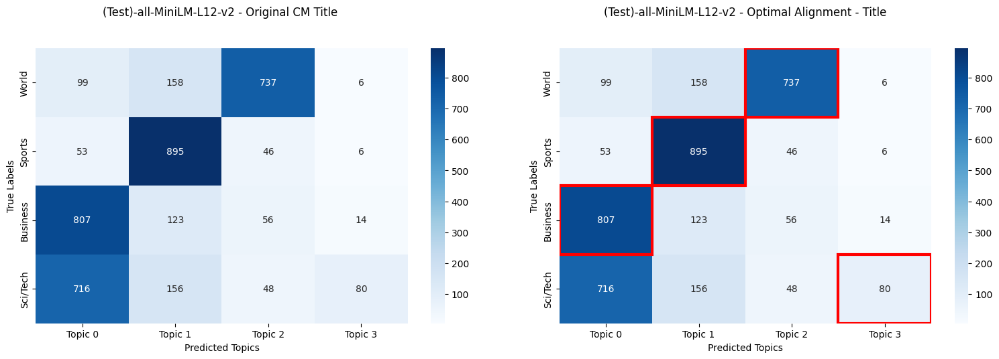

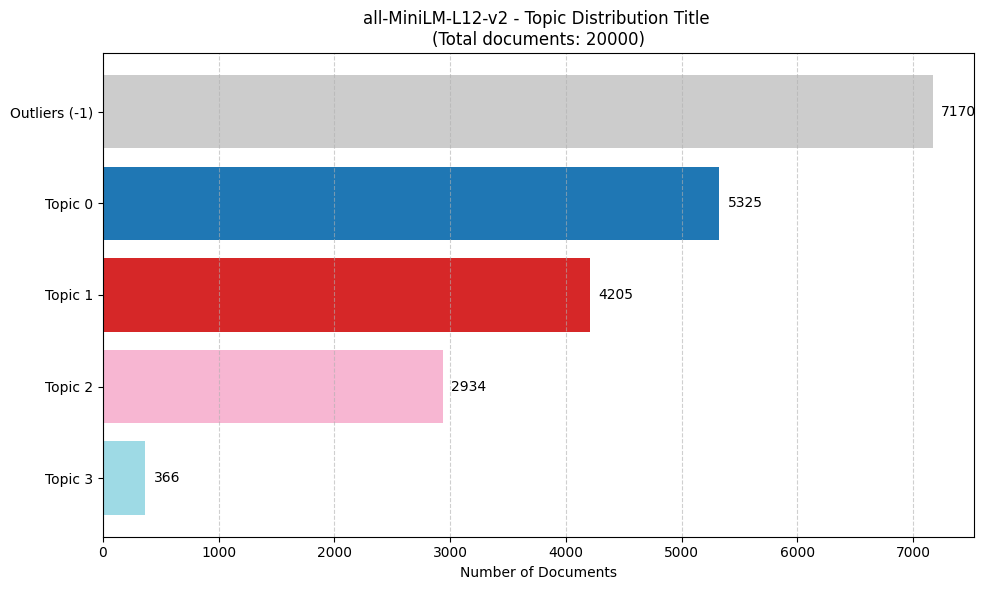

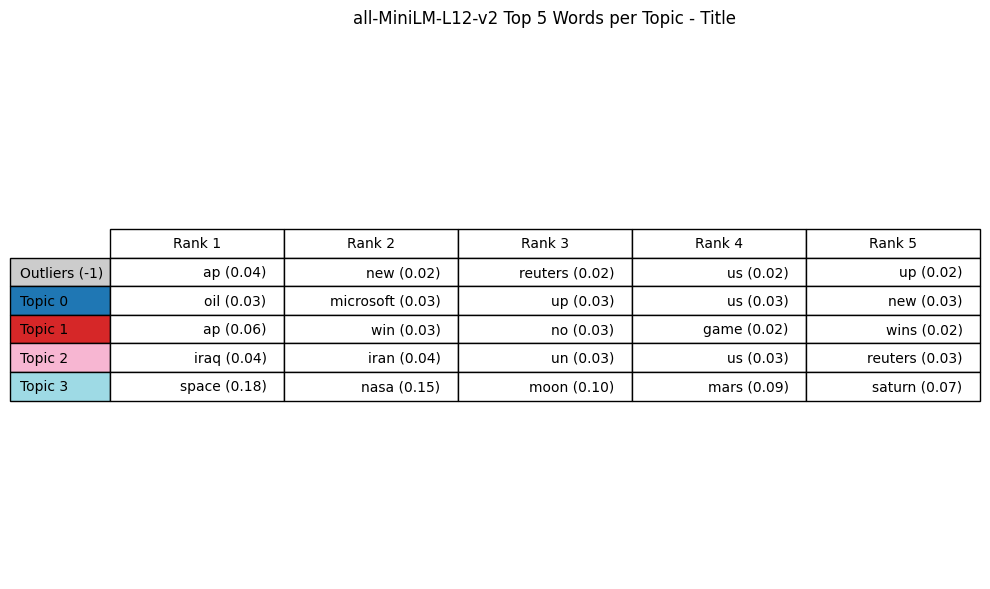

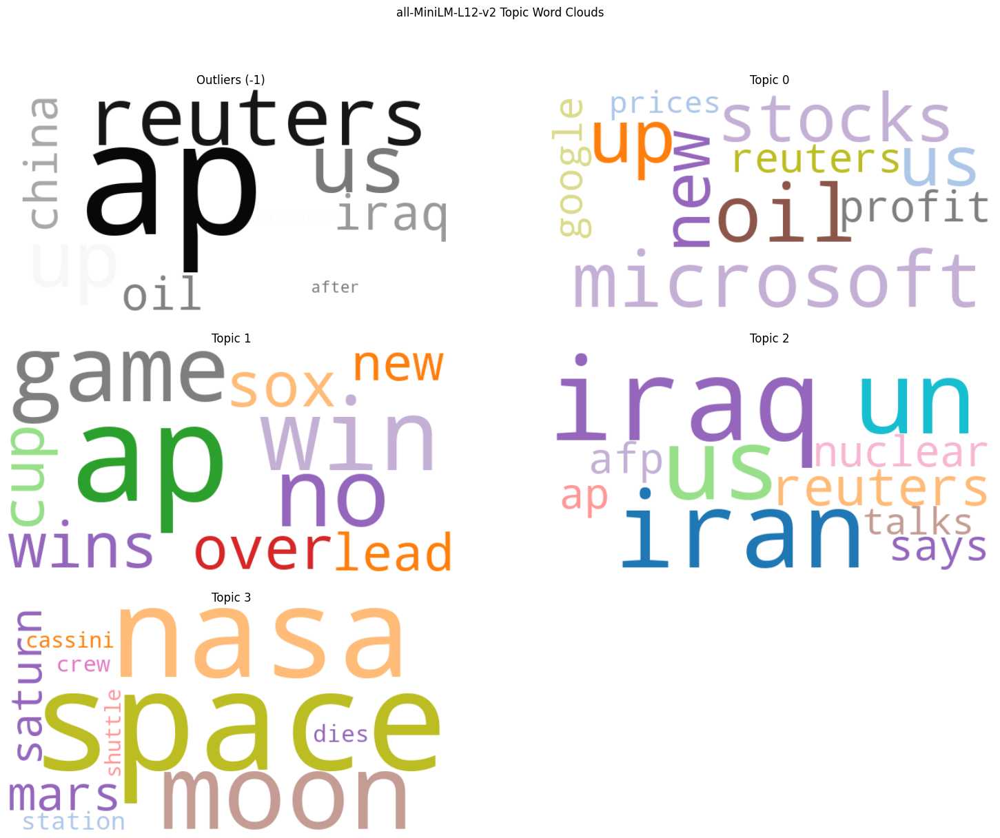

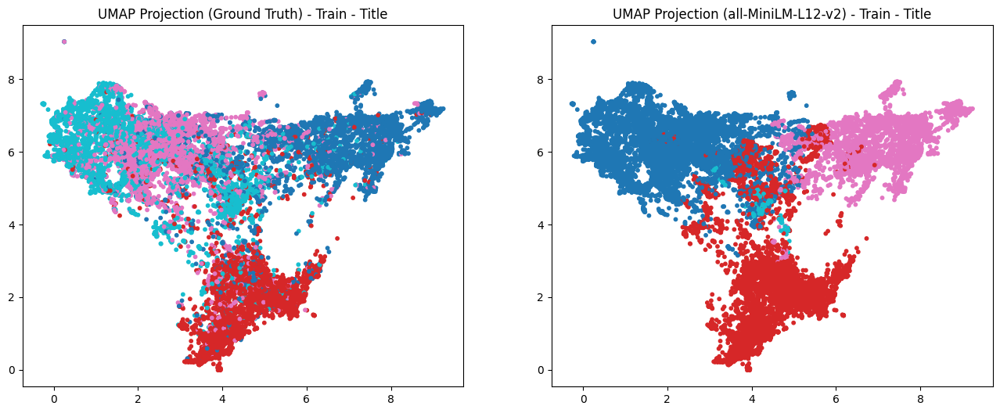

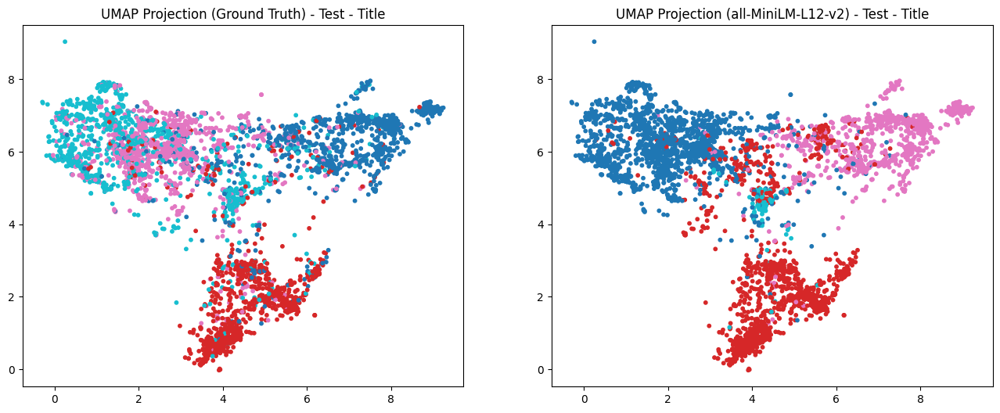


Top words per topic:
   Topic  Count                    Name  \
0     -1   7170    -1_ap_new_reuters_us   
1      0   5325   0_oil_microsoft_up_us   
2      1   4205        1_ap_win_no_game   
3      2   2934       2_iraq_iran_un_us   
4      3    366  3_space_nasa_moon_mars   

                                      Representation  \
0  [ap, new, reuters, us, up, iraq, china, oil, m...   
1  [oil, microsoft, up, us, new, stocks, profit, ...   
2  [ap, win, no, game, wins, sox, cup, over, lead...   
3  [iraq, iran, un, us, reuters, nuclear, says, a...   
4  [space, nasa, moon, mars, saturn, station, die...   

                                 Representative_Docs  
0  [record high oil prices hit asian markets, her...  
1  [oil prices up yukos woes, stocks fall oil hit...  
2  [bellhorn homer earns red sox game one win, pr...  
3  [afghan militants say hold talks un hostages, ...  
4  [crew prepares launch space station (ap), russ...  

Topic 0 - Representative documents:
  Example: surg

2025-06-24 12:39:49,641 - BERTopic - Embedding - Transforming documents to embeddings.


Fitting BERTopic all-mpnet-base-v2 model...


Batches: 100%|██████████| 625/625 [00:16<00:00, 37.77it/s]
2025-06-24 12:40:06,259 - BERTopic - Embedding - Completed ✓
2025-06-24 12:40:06,259 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-06-24 12:40:13,309 - BERTopic - Dimensionality - Completed ✓
2025-06-24 12:40:13,310 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-06-24 12:41:32,472 - BERTopic - Cluster - Completed ✓
2025-06-24 12:41:32,473 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-06-24 12:41:32,647 - BERTopic - Representation - Completed ✓
2025-06-24 12:41:32,647 - BERTopic - Topic reduction - Reducing number of topics
2025-06-24 12:41:32,667 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-06-24 12:41:32,719 - BERTopic - Representation - Completed ✓
2025-06-24 12:41:32,723 - BERTopic - Topic reduction - Reduced number of topics from 424 to 5
Batches: 100%|██████████| 125/125 [00:03<00:00, 41

Predicted topic counts (train): Counter({0: 9598, -1: 6784, 1: 3439, 2: 143, 3: 36})
Predicted topic counts (test): [0, 1, 1, 0, 0, -1, 0, 1, 0, -1, -1, -1, 0, 0, 1, 0, -1, 0, -1, 0, 0, 0, 0, 0, 0, 1, 0, -1, 0, -1, 0, 1, 1, -1, 1, -1, 0, -1, 0, 0, 0, 0, 1, -1, 0, 0, 0, 1, -1, 0, -1, -1, 0, -1, 0, -1, 0, 0, 1, 1, 0, 0, 0, -1, -1, -1, -1, 0, 1, 1, 0, -1, 1, -1, 0, 0, -1, -1, 0, -1, 2, 1, 0, 1, 1, 0, 0, -1, -1, -1, -1, 0, 0, 0, 0, 0, -1, 1, -1, -1, -1, 0, 0, 0, 1, 0, -1, 0, -1, 1, -1, 0, 0, -1, 1, 0, 1, 0, 1, 1, -1, 0, -1, 0, 0, 0, 0, -1, 0, 0, 0, 1, -1, 1, 0, 0, 0, -1, 0, -1, 1, -1, -1, -1, 1, 0, 0, 1, 0, -1, -1, -1, 1, 0, 0, 1, -1, -1, 0, 0, -1, 0, 0, -1, -1, 1, -1, -1, -1, 1, 0, -1, -1, 0, -1, 0, 0, 1, -1, 0, 1, 0, 0, -1, 0, -1, 0, 1, -1, -1, 0, 0, -1, -1, -1, -1, 1, 0, -1, -1, 0, -1, 1, -1, -1, 0, -1, 0, 0, -1, 1, 0, 1, 0, 1, -1, -1, 0, 1, 0, 1, 0, -1, 0, 0, 1, 0, 1, 0, -1, 1, -1, -1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, -1, 0, 0, 1, 0, 0, 1, 1, -1, 0, 0, 0, 0, -1, 0, -1, 0, 0, 0, -1, -1, 0,

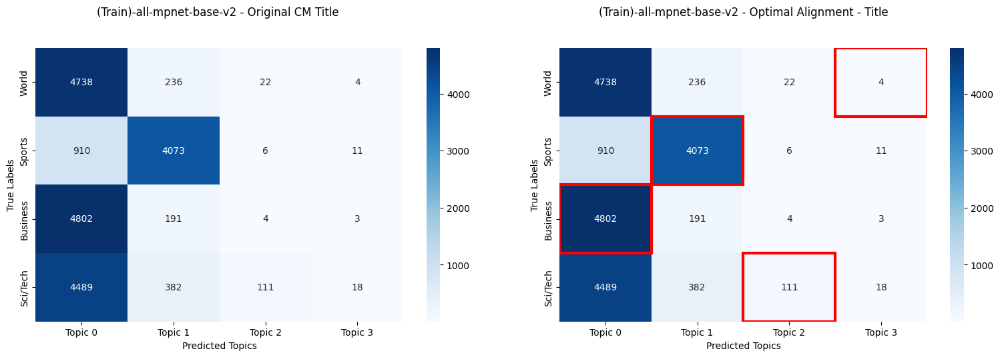


(Test)-all-mpnet-base-v2 Performance:
ARI: 0.1926
NMI: 0.2666
Homogeneity: 0.1956
Completeness: 0.4186
V-Measure: 0.2666
Aligned_Accuracy: 0.4497
Macro_F1: 0.3386
Weighted_F1: 0.3386

Optimal Topic-Label Alignment:
Topic 3 -> World (1 samples)
Topic 1 -> Sports (826 samples)
Topic 0 -> Business (938 samples)
Topic 2 -> Sci/Tech (34 samples)


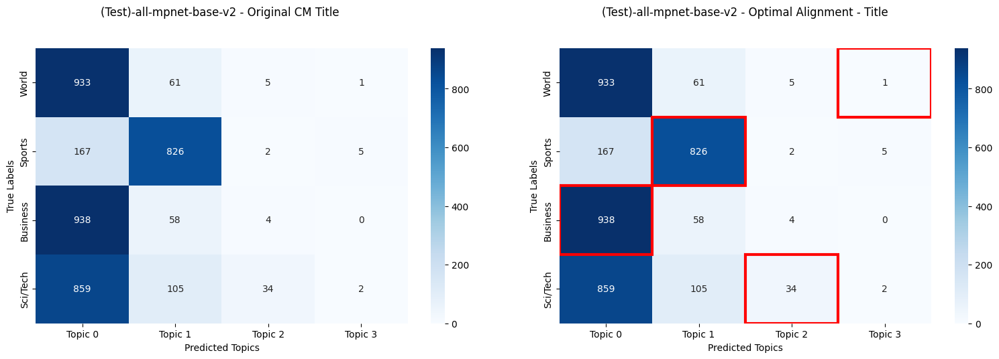

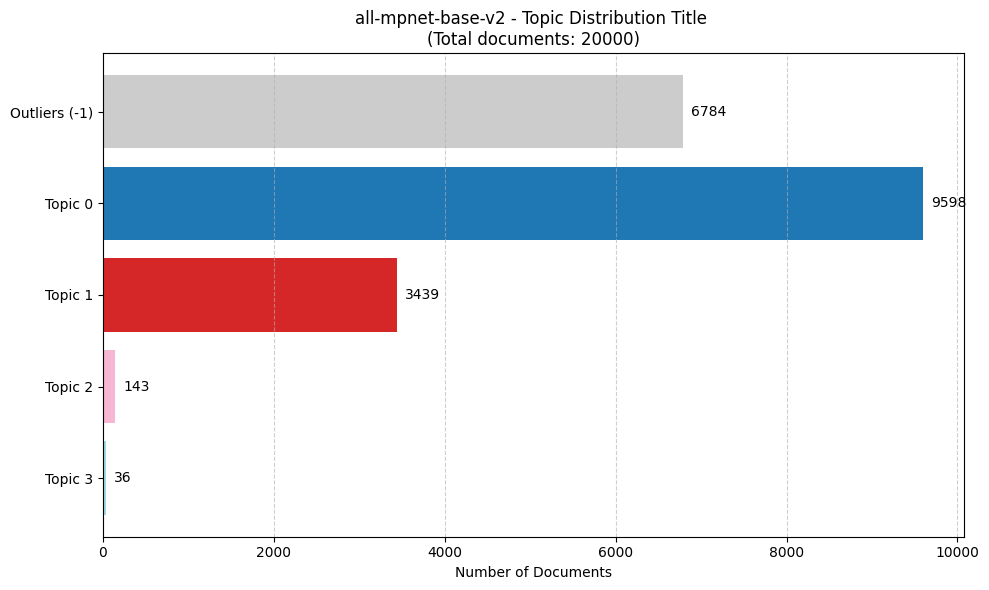

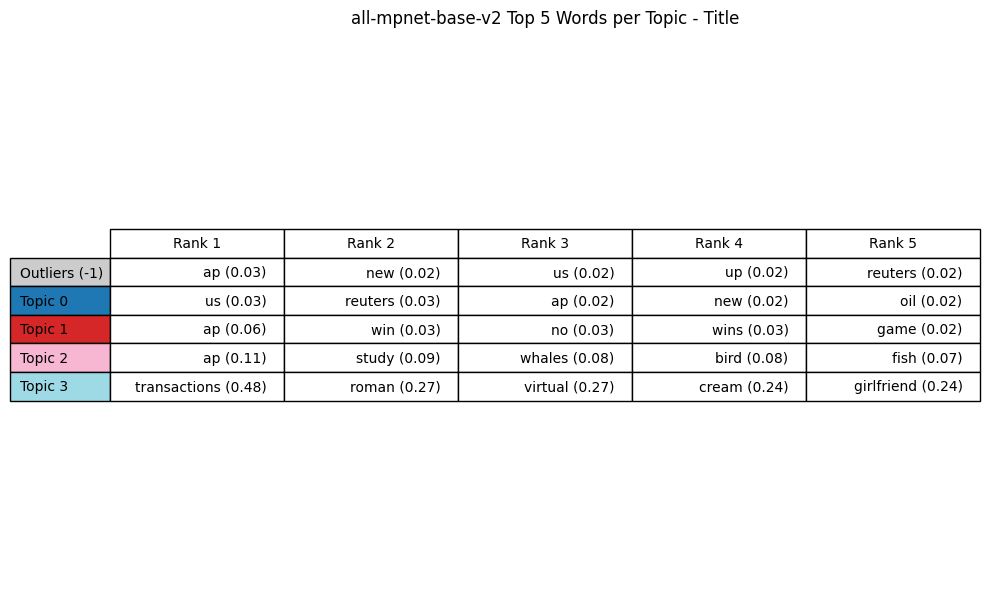

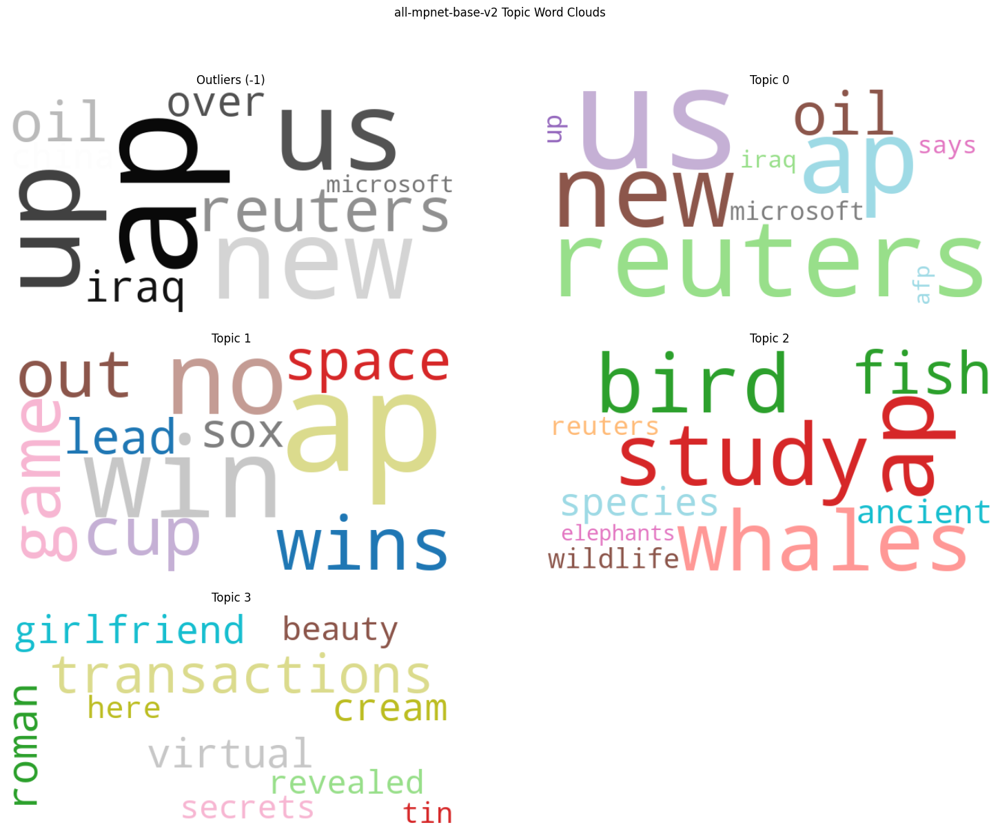

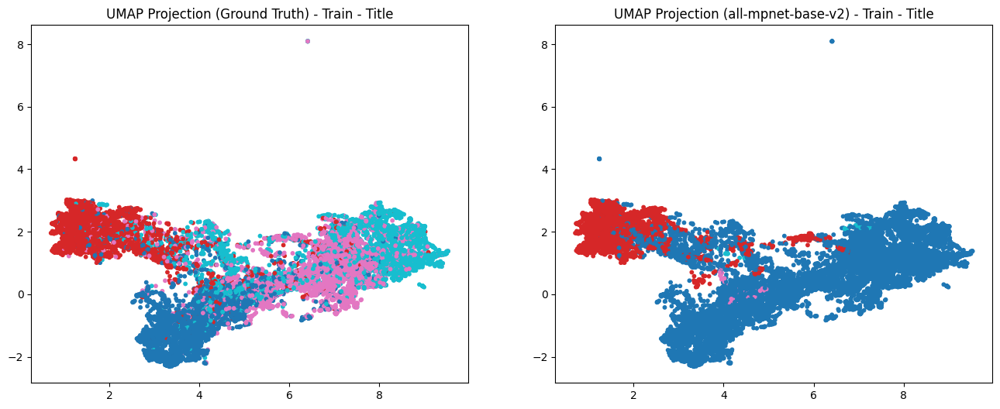

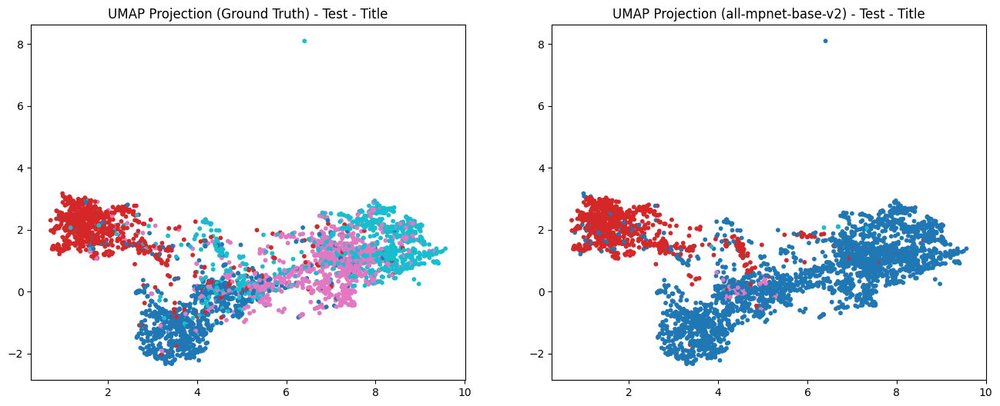


Top words per topic:
   Topic  Count                                Name  \
0     -1   6784                     -1_ap_new_us_up   
1      0   9598                 0_us_reuters_ap_new   
2      1   3439                    1_ap_win_no_wins   
3      2    143              2_ap_study_whales_bird   
4      3     36  3_transactions_roman_virtual_cream   

                                      Representation  \
0  [ap, new, us, up, reuters, oil, iraq, over, ch...   
1  [us, reuters, ap, new, oil, microsoft, up, say...   
2  [ap, win, no, wins, game, cup, out, space, lea...   
3  [ap, study, whales, bird, fish, species, ancie...   
4  [transactions, roman, virtual, cream, girlfrie...   

                                 Representative_Docs  
0  [stock market signals positive ge profit repor...  
1  [microsoft says linux may mean price cuts, us ...  
2  [nhl lock out players (ap), nl wrap: bonds kep...  
3  [new bird species discovered, scientists 17 na...  
4         [transactions, transactio

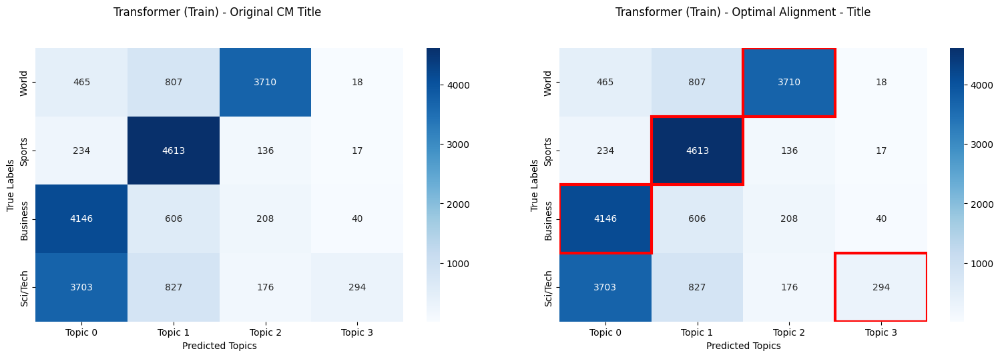


Transformer (Test) Performance:
ARI: 0.3748
NMI: 0.3752
Homogeneity: 0.3447
Completeness: 0.4116
V-Measure: 0.3752
Aligned_Accuracy: 0.6298
Macro_F1: 0.5742
Weighted_F1: 0.5742

Optimal Topic-Label Alignment:
Topic 2 -> World (737 samples)
Topic 1 -> Sports (895 samples)
Topic 0 -> Business (807 samples)
Topic 3 -> Sci/Tech (80 samples)


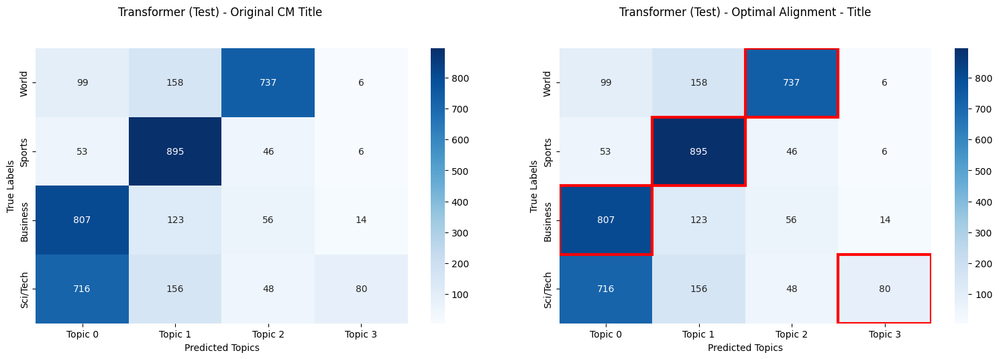

In [11]:
tm.run_transformer_topic_modeling()

2025-06-24 12:42:22,672 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2025-06-24 12:42:22,857 - top2vec - INFO - Downloading universal-sentence-encoder model
INFO:top2vec:Downloading universal-sentence-encoder model



=== Running Top2Vec for Exploration ===
Training Top2Vec on 20000 documents...


2025-06-24 12:42:26,653 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2025-06-24 12:42:27,111 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2025-06-24 12:42:33,762 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2025-06-24 12:42:34,008 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


Top2Vec found 389 topics
Before reduction: 389
After reduction: 4
Reduction result: [[289, 279, 14, 155, 233, 269, 80, 340, 128, 377, 179, 180, 176, 236, 335, 338, 339, 40, 42, 288, 359, 162, 71, 82, 217, 48, 0, 33, 172, 203, 196, 121, 260, 142, 232, 170, 92, 284, 210, 109, 187, 51, 315, 43, 118, 164, 145, 7, 63, 178, 3, 78, 372, 129, 242, 239, 299, 96, 253, 147, 213, 127, 191, 185, 138, 116, 248, 54, 184, 316, 223, 300, 214, 174, 166, 34, 374, 93, 373, 119, 349, 159, 148, 199, 29, 318, 222, 229, 266, 303, 23, 8, 273, 57, 39, 330, 108, 177, 49], [277, 107, 247, 355, 151, 65, 238, 281, 278, 306, 309, 104, 283, 62, 314, 194, 144, 385, 4, 254, 317, 68, 94, 90, 295, 12, 113, 370, 275, 234, 371, 342, 307, 304, 220, 130, 350, 228, 216, 369, 131, 329, 141, 240, 268, 296, 345, 25, 189, 58, 175, 100, 102, 64, 161, 205, 70, 73, 140, 356, 15, 103, 285, 308, 230, 363, 367, 251, 99, 143, 368, 35, 267, 327, 13, 235, 76, 55, 324, 211, 344, 219, 264, 319, 156, 221, 44, 313, 115, 333, 195, 95, 167, 22,

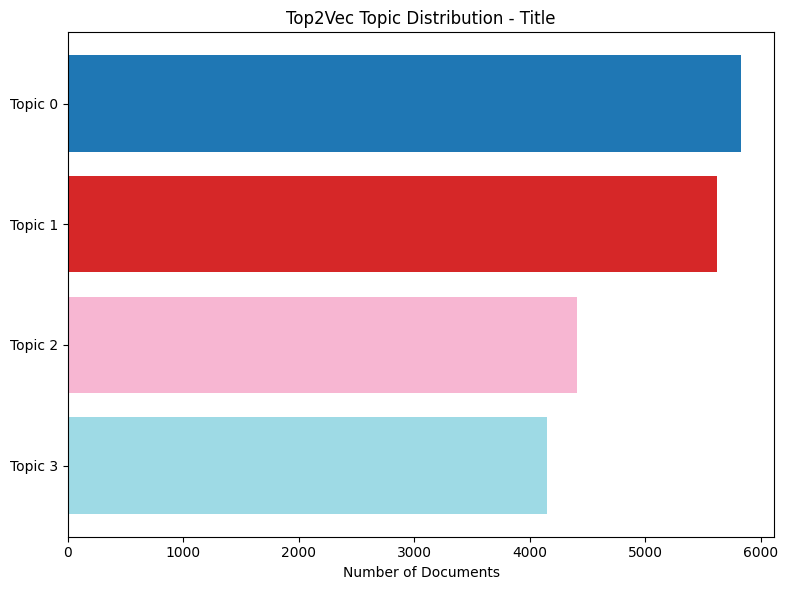

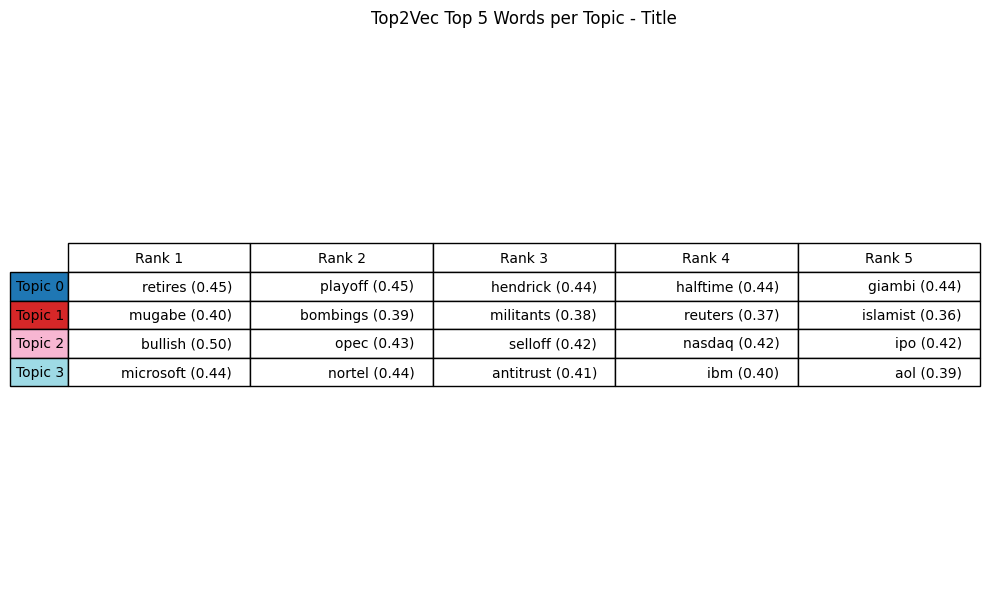

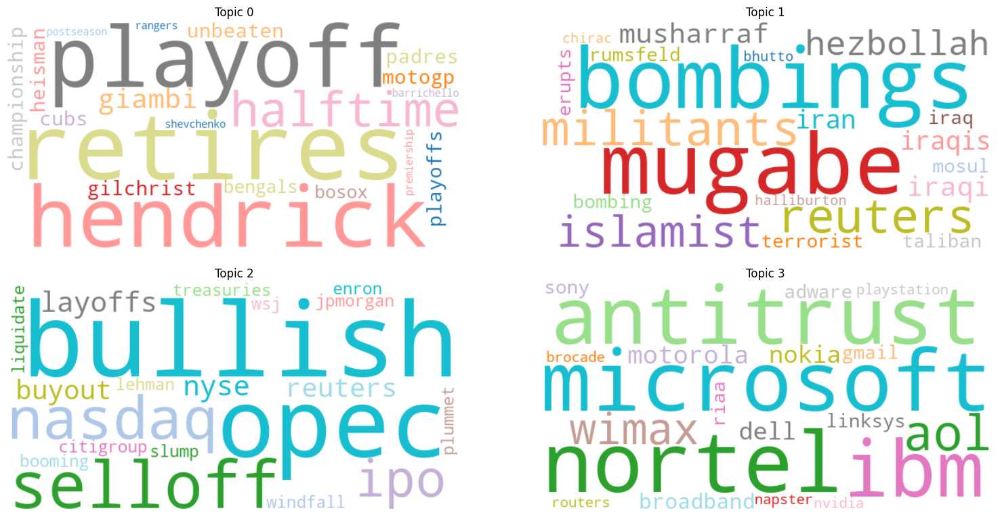


Top2Vec (Train) Performance:
ARI: 0.5026
NMI: 0.4678
Homogeneity: 0.4659
Completeness: 0.4696
V-Measure: 0.4678
Aligned_Accuracy: 0.7744
Macro_F1: 0.7705
Weighted_F1: 0.7705

Optimal Topic-Label Alignment:
Topic 1 -> World (4224 samples)
Topic 0 -> Sports (4595 samples)
Topic 2 -> Business (3404 samples)
Topic 3 -> Sci/Tech (3266 samples)


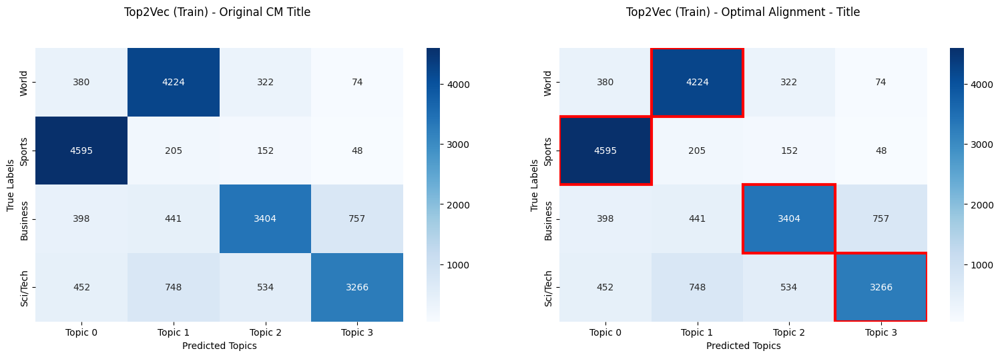


Evaluating on test set...

Top2Vec (Test) Performance:
ARI: 0.4140
NMI: 0.4057
Homogeneity: 0.4006
Completeness: 0.4110
V-Measure: 0.4057
Aligned_Accuracy: 0.7320
Macro_F1: 0.7301
Weighted_F1: 0.7301

Optimal Topic-Label Alignment:
Topic 1 -> World (878 samples)
Topic 0 -> Sports (820 samples)
Topic 2 -> Business (615 samples)
Topic 3 -> Sci/Tech (615 samples)


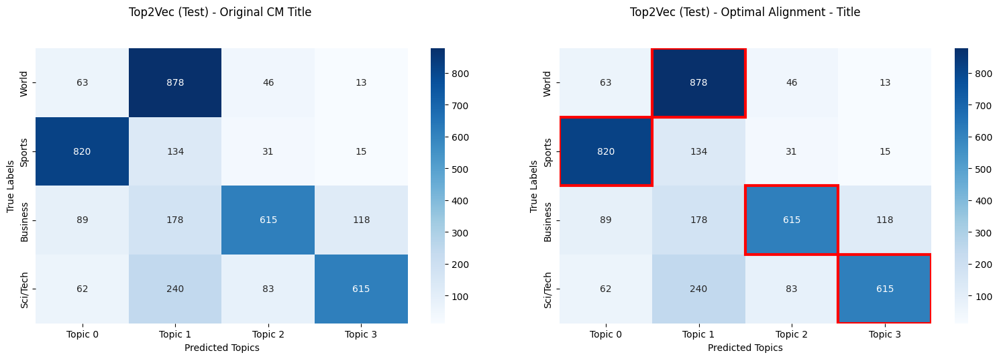


Test Set Assignment Quality:
Assigned documents: 4000/4000
Mean assignment score: 0.55
Median assignment score: 0.56


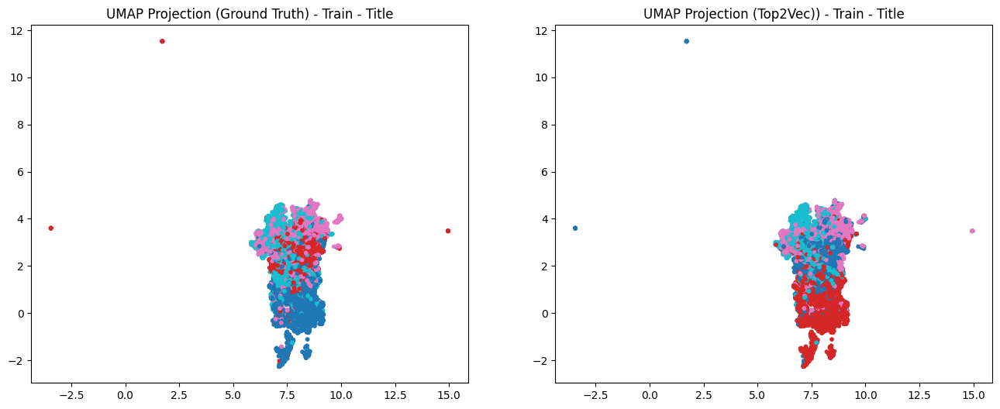

In [12]:
tm.run_top2vec()


=== Running Ensemble Methods ===
Ensembling 2 models: ['Transformer', 'Top2Vec']

Ensemble (Train) Performance:
ARI: 0.3973
NMI: 0.4073
Homogeneity: 0.3700
Completeness: 0.4529
V-Measure: 0.4073
Aligned_Accuracy: 0.6381
Macro_F1: 0.5760
Weighted_F1: 0.5760

Optimal Topic-Label Alignment:
Topic 2 -> World (3710 samples)
Topic 1 -> Sports (4613 samples)
Topic 0 -> Business (4146 samples)
Topic 3 -> Sci/Tech (294 samples)


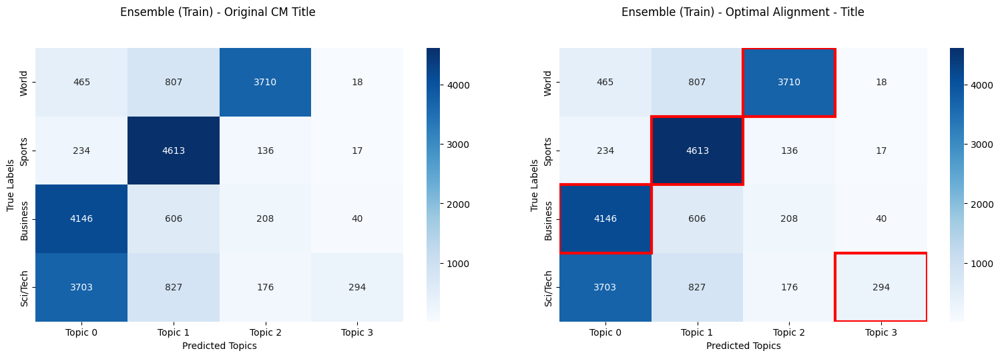


Ensemble (Test) Performance:
ARI: 0.3748
NMI: 0.3752
Homogeneity: 0.3447
Completeness: 0.4116
V-Measure: 0.3752
Aligned_Accuracy: 0.6298
Macro_F1: 0.5742
Weighted_F1: 0.5742

Optimal Topic-Label Alignment:
Topic 2 -> World (737 samples)
Topic 1 -> Sports (895 samples)
Topic 0 -> Business (807 samples)
Topic 3 -> Sci/Tech (80 samples)


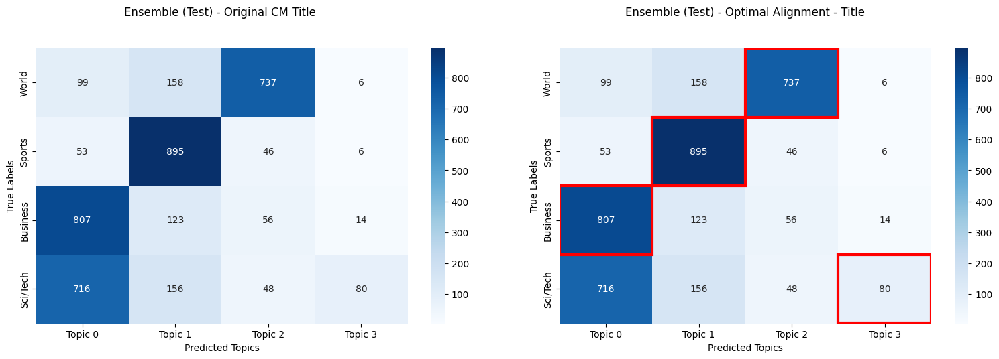

In [13]:
tm.run_ensemble_methods()


FINAL PERFORMANCE COMPARISON

Test Set Performance Comparison:
                 Model    ARI    NMI  Homogeneity  Completeness  V-Measure  Aligned_Accuracy  Macro_F1  Weighted_F1
BERT_all-MiniLM-L12-v2 0.3748 0.3752       0.3447        0.4116     0.3752            0.6298    0.5742       0.5742
BERT_all-mpnet-base-v2 0.1926 0.2666       0.1956        0.4186     0.2666            0.4498    0.3386       0.3386
               Top2Vec 0.4140 0.4057       0.4006        0.4110     0.4057            0.7320    0.7301       0.7301
              Ensemble 0.3748 0.3752       0.3447        0.4116     0.3752            0.6298    0.5742       0.5742

----------------------------------------
BEST PERFORMING MODELS:
----------------------------------------
ARI: Top2Vec (0.4140)
NMI: Top2Vec (0.4057)
Homogeneity: Top2Vec (0.4006)
Completeness: BERT_all-mpnet-base-v2 (0.4186)
V-Measure: Top2Vec (0.4057)
Aligned_Accuracy: Top2Vec (0.7320)


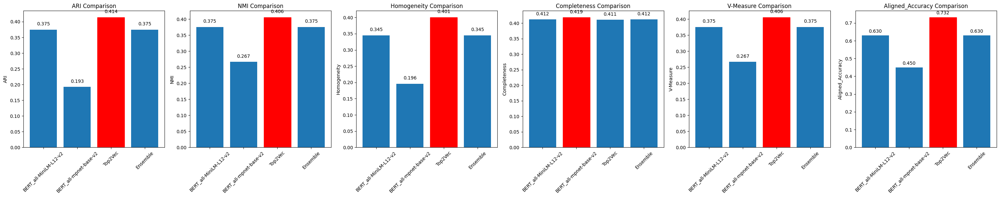

In [14]:
tm.generate_final_comparison()

### Topic modelling on Description + Title

Loading AG-News dataset...
--- Loading and Preparing Data ---
SHAPE train  (120000, 3)
SHAPE test  (7600, 3)
TRAIN Cols  Index(['Class Index', 'Title', 'Description'], dtype='object')
TRAIN LABELS  labels
1    30000
2    30000
3    30000
4    30000
Name: count, dtype: int64
TEST LABELS  labels
1    1900
2    1900
3    1900
4    1900
Name: count, dtype: int64
Index(['labels', 'Title', 'Description'], dtype='object')
SUBSAMPLING
(20000, 3)
Training data shape: (20000, 4)
training data cols:  Index(['labels', 'Title', 'Description', 'Combined'], dtype='object')
Test data shape: (4000, 4)
testing data cols:  Index(['labels', 'Title', 'Description', 'Combined'], dtype='object')
Label distribution in training: {2: 5000, 3: 5000, 1: 5000, 4: 5000}
Loading and preprocessing AG-News data...
train df  (20000, 4)
test df  (4000, 4)
LABELS are:
{0, 1, 2, 3}
Generating embeddings for optimal k calculation...
Finding optimal number of clusters using Elbow method...
Elbow method suggests k = 4
Best s

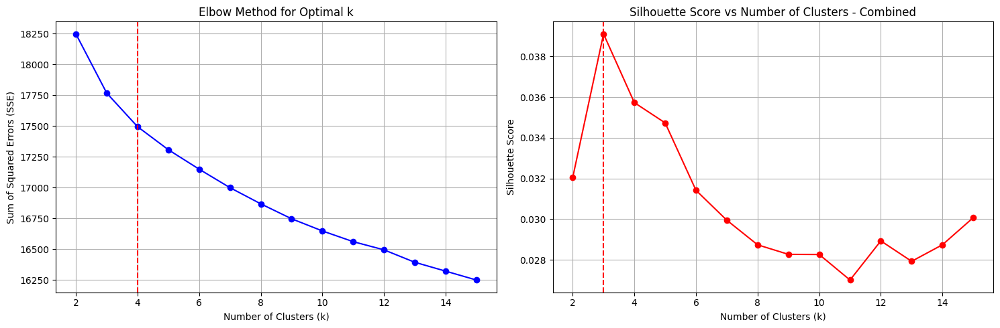

Loaded 20000 training texts and 4000 test texts
Categories distribution: Counter({1: 5000, 2: 5000, 0: 5000, 3: 5000})
baseball: jets flying weekend sees "other showdown between new york new england jets patriots clash battle unbeaten teams.


In [15]:
tm = impl.AGNewsTopicModeling()
tm.load_data(column='Combined')
print(tm.processed_texts[0])


=== Run Transformer-based Topic Modeling (Bertopic) ===
Testing all-MiniLM-L12-v2...

=== Running BERTopic all-MiniLM-L12-v2 ===


2025-06-24 12:45:13,420 - BERTopic - Embedding - Transforming documents to embeddings.


Fitting BERTopic all-MiniLM-L12-v2 model...


Batches: 100%|██████████| 625/625 [00:15<00:00, 40.60it/s]
2025-06-24 12:45:28,955 - BERTopic - Embedding - Completed ✓
2025-06-24 12:45:28,956 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-06-24 12:45:35,393 - BERTopic - Dimensionality - Completed ✓
2025-06-24 12:45:35,394 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-06-24 12:47:25,485 - BERTopic - Cluster - Completed ✓
2025-06-24 12:47:25,486 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-06-24 12:47:25,800 - BERTopic - Representation - Completed ✓
2025-06-24 12:47:25,800 - BERTopic - Topic reduction - Reducing number of topics
2025-06-24 12:47:25,819 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-06-24 12:47:26,026 - BERTopic - Representation - Completed ✓
2025-06-24 12:47:26,030 - BERTopic - Topic reduction - Reduced number of topics from 450 to 5
Batches: 100%|██████████| 125/125 [00:03<00:00, 38

Predicted topic counts (train): Counter({0: 5707, -1: 5568, 1: 4833, 2: 3746, 3: 146})
Predicted topic counts (test): [1, 2, 2, 0, -1, 1, -1, 2, -1, 2, 2, -1, -1, 0, 2, 1, 0, 0, 0, 0, -1, 0, 1, -1, 1, 2, 0, 0, 1, 0, 0, -1, 2, 0, -1, -1, 1, 2, 1, 1, -1, 1, 2, 0, -1, 1, 0, 1, 1, -1, 1, 1, 1, 1, 1, -1, -1, 0, 2, -1, 1, 0, 1, -1, 2, -1, 0, -1, 2, -1, 0, 1, 2, -1, 2, -1, 1, -1, 1, -1, 1, 2, 1, 2, 0, 0, 1, 2, -1, 0, -1, 1, -1, 1, -1, 0, 0, 2, 1, 1, -1, -1, 1, 0, -1, 1, -1, 0, -1, 1, -1, 0, 0, 2, 2, 0, 2, -1, 2, -1, 2, -1, -1, 1, 1, -1, 1, -1, -1, 2, 1, 2, -1, -1, -1, 0, -1, -1, 1, -1, 2, 1, -1, -1, 2, -1, 1, 1, -1, 1, -1, 0, 2, 0, -1, 2, -1, -1, 1, 0, -1, -1, 0, -1, -1, 2, -1, -1, -1, 2, 1, 0, 2, 0, 0, 1, 1, -1, -1, 1, -1, -1, 0, 0, 1, 0, 1, -1, 1, 0, 0, -1, 0, 1, 0, -1, 0, 0, 2, 1, 1, -1, 1, -1, 1, -1, 0, 1, 0, 2, -1, 1, -1, 0, 1, -1, -1, 1, 1, -1, 2, 1, -1, 1, 0, -1, 0, 0, 0, -1, -1, -1, -1, 2, 2, 0, 2, 2, 2, -1, -1, 1, -1, -1, 0, 1, -1, -1, 1, 2, 2, 0, -1, -1, 1, 1, 1, 1, -1, 0, 1, -1, -1

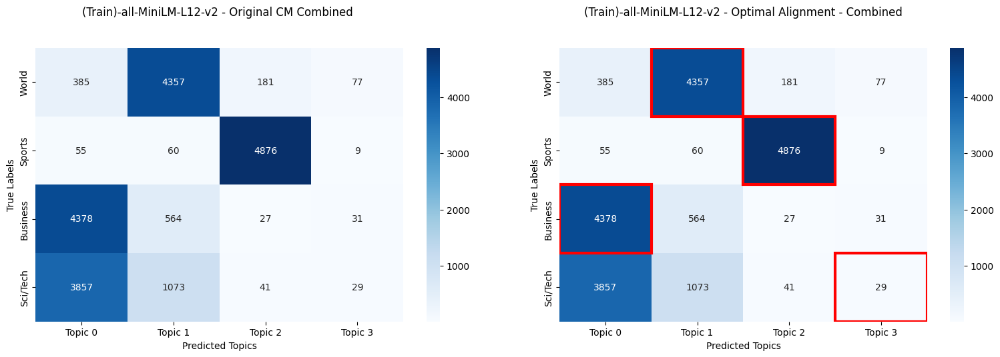


(Test)-all-MiniLM-L12-v2 Performance:
ARI: 0.4790
NMI: 0.5031
Homogeneity: 0.4520
Completeness: 0.5672
V-Measure: 0.5031
Aligned_Accuracy: 0.6637
Macro_F1: 0.5836
Weighted_F1: 0.5836

Optimal Topic-Label Alignment:
Topic 1 -> World (863 samples)
Topic 2 -> Sports (940 samples)
Topic 0 -> Business (848 samples)
Topic 3 -> Sci/Tech (4 samples)


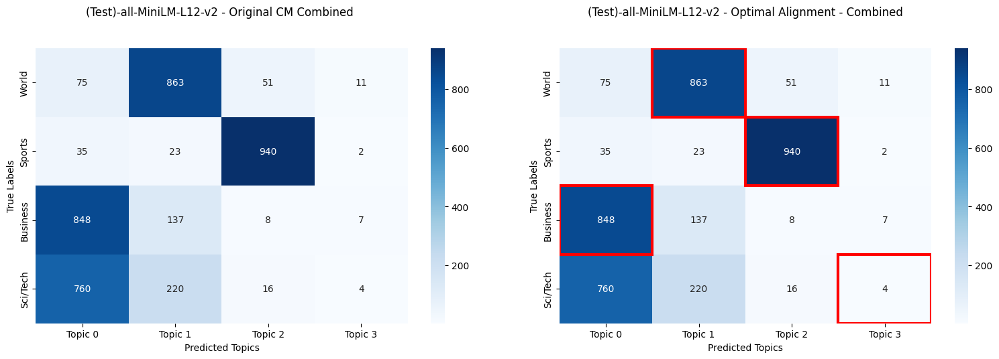

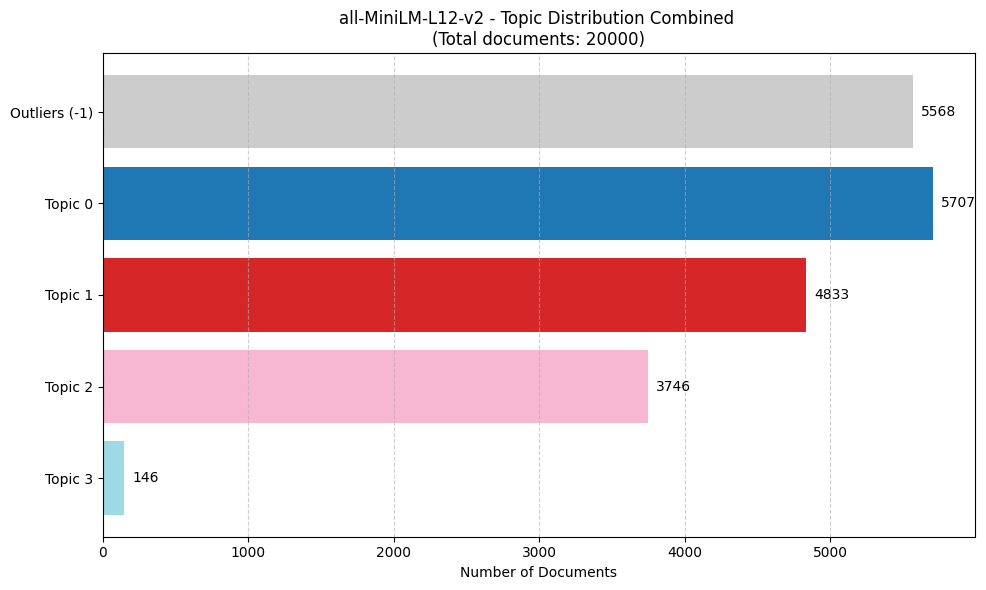

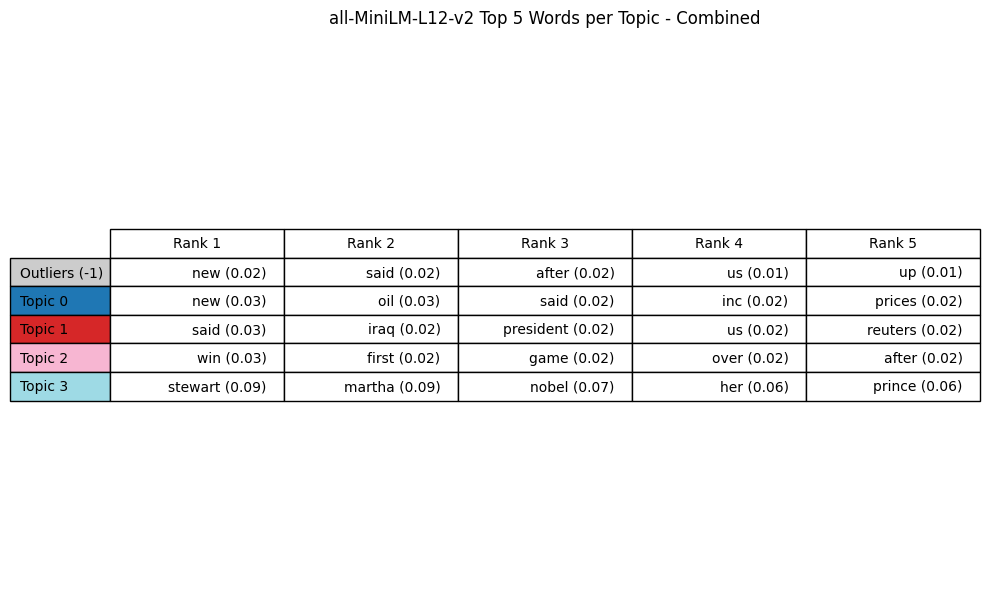

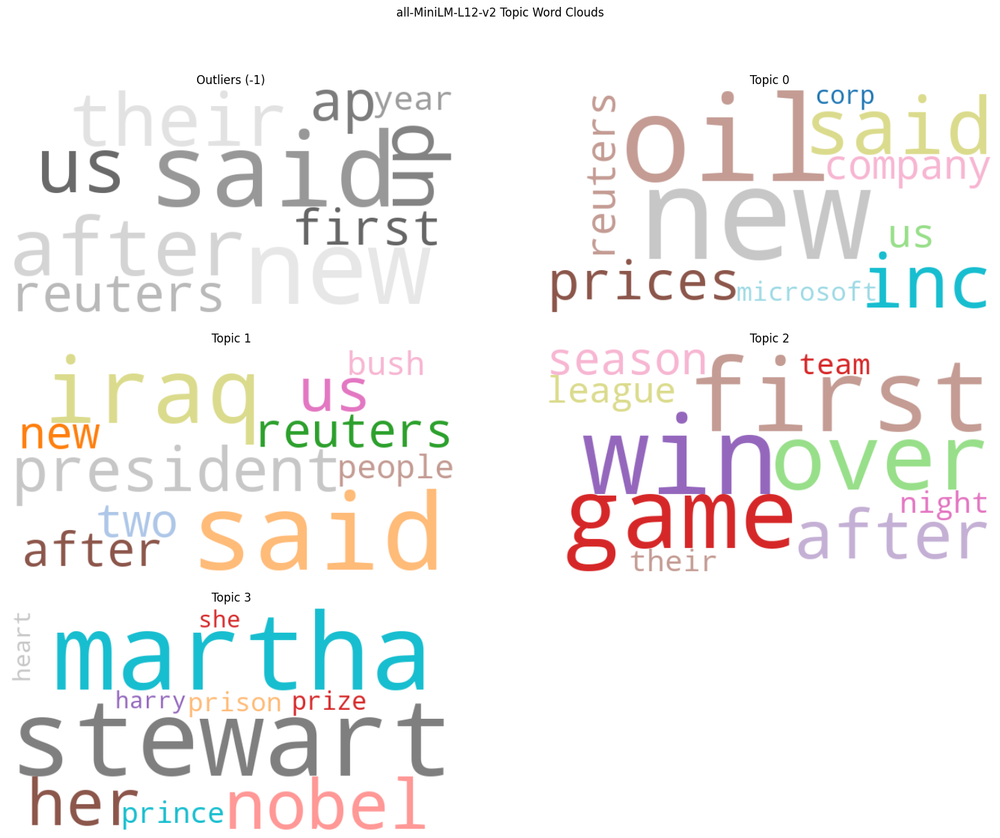

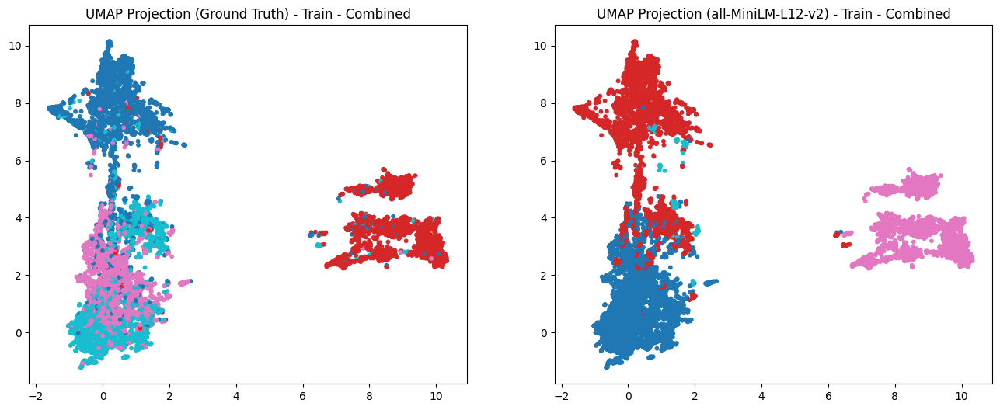

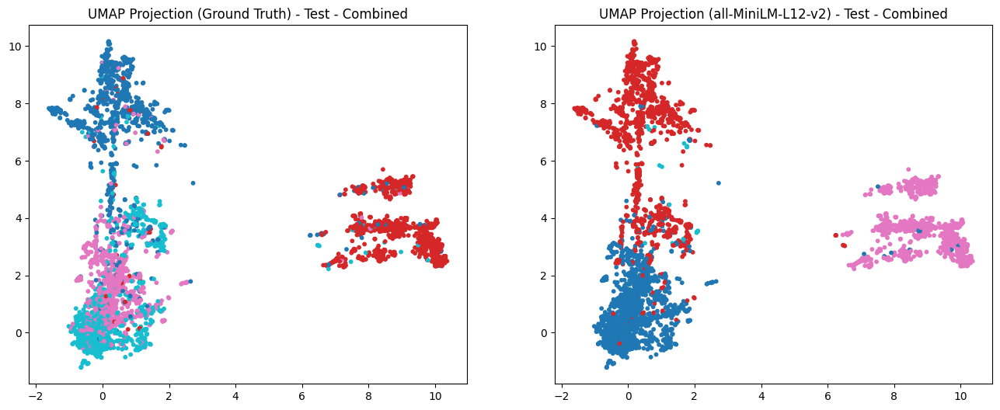


Top words per topic:
   Topic  Count                        Name  \
0     -1   5568        -1_new_said_after_us   
1      0   5707          0_new_oil_said_inc   
2      1   4833    1_said_iraq_president_us   
3      2   3746       2_win_first_game_over   
4      3    146  3_stewart_martha_nobel_her   

                                      Representation  \
0  [new, said, after, us, up, their, ap, reuters,...   
1  [new, oil, said, inc, prices, company, reuters...   
2  [said, iraq, president, us, reuters, after, tw...   
3  [win, first, game, over, after, season, league...   
4  [stewart, martha, nobel, her, prince, prison, ...   

                                 Representative_Docs  
0  [microsoft signs up tie-up indian firms softwa...  
1  [stocks seen slightly higher, oil slips us sto...  
2  [israeli missile hits militants gaza camp, hur...  
3  [angels crash earth red sox run riot manny ram...  
4  [martha heading west virginia jail martha stew...  

Topic 0 - Representative do

2025-06-24 12:48:24,099 - BERTopic - Embedding - Transforming documents to embeddings.


Fitting BERTopic all-mpnet-base-v2 model...


Batches: 100%|██████████| 625/625 [00:44<00:00, 14.00it/s]
2025-06-24 12:49:08,885 - BERTopic - Embedding - Completed ✓
2025-06-24 12:49:08,885 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-06-24 12:49:15,825 - BERTopic - Dimensionality - Completed ✓
2025-06-24 12:49:15,826 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-06-24 12:51:13,761 - BERTopic - Cluster - Completed ✓
2025-06-24 12:51:13,761 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-06-24 12:51:14,109 - BERTopic - Representation - Completed ✓
2025-06-24 12:51:14,109 - BERTopic - Topic reduction - Reducing number of topics
2025-06-24 12:51:14,133 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-06-24 12:51:14,351 - BERTopic - Representation - Completed ✓
2025-06-24 12:51:14,354 - BERTopic - Topic reduction - Reduced number of topics from 473 to 5
Batches: 100%|██████████| 125/125 [00:09<00:00, 13

Predicted topic counts (train): Counter({0: 6496, -1: 5073, 1: 4027, 2: 3549, 3: 855})
Predicted topic counts (test): [0, 1, 1, 0, -1, -1, 0, 1, 2, 1, 1, -1, -1, 0, 1, 2, -1, 0, 0, 0, -1, 0, 2, -1, 0, -1, 0, 0, 2, 0, 0, -1, 1, -1, 1, 2, 2, -1, 0, 0, -1, 2, 1, 0, -1, 3, 0, 3, -1, 1, -1, -1, 2, -1, 2, 0, 0, 0, 1, 1, -1, -1, 2, -1, 1, 2, -1, 2, 1, 1, -1, 0, -1, 0, 2, -1, 2, -1, 2, 2, 3, 1, 2, 1, 0, 0, 2, 1, -1, -1, -1, 2, -1, 2, 2, -1, -1, -1, -1, -1, 1, -1, 2, 0, 1, 2, -1, 0, 3, 3, -1, 0, -1, -1, 1, -1, 1, 0, 1, -1, -1, -1, -1, 2, 2, -1, -1, -1, 2, 1, 2, -1, 1, 1, -1, 0, -1, 0, 2, -1, 1, -1, 2, -1, 1, -1, 2, 3, 0, 2, 0, 0, 1, -1, 0, 1, -1, -1, 2, 0, 0, -1, 0, 1, 1, 1, -1, -1, -1, 1, 2, -1, -1, 0, 0, 3, -1, -1, 2, 2, 1, 0, 0, 0, 2, -1, -1, -1, 2, -1, 0, 3, 0, 3, -1, -1, 1, 0, 2, 2, 2, 0, 3, -1, 0, -1, 0, 2, 0, -1, -1, 0, 1, 0, 3, 2, 0, 2, 3, 0, 1, -1, -1, 0, -1, -1, 0, -1, -1, -1, -1, 3, -1, 2, 1, 0, 1, 1, 1, 0, 2, 2, 1, -1, 0, 3, 1, 0, 0, 1, 1, -1, 2, -1, -1, 2, -1, 2, -1, 0, 2, 0, -1, 0

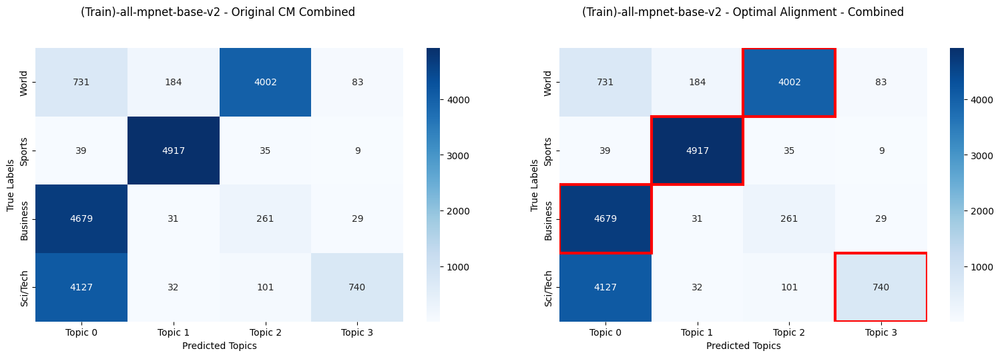


(Test)-all-mpnet-base-v2 Performance:
ARI: 0.4827
NMI: 0.5356
Homogeneity: 0.4946
Completeness: 0.5839
V-Measure: 0.5356
Aligned_Accuracy: 0.6943
Macro_F1: 0.6591
Weighted_F1: 0.6591

Optimal Topic-Label Alignment:
Topic 2 -> World (751 samples)
Topic 1 -> Sports (945 samples)
Topic 0 -> Business (926 samples)
Topic 3 -> Sci/Tech (155 samples)


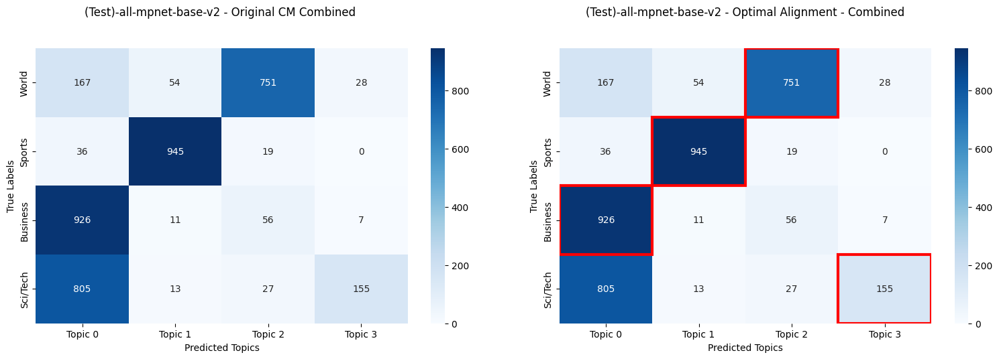

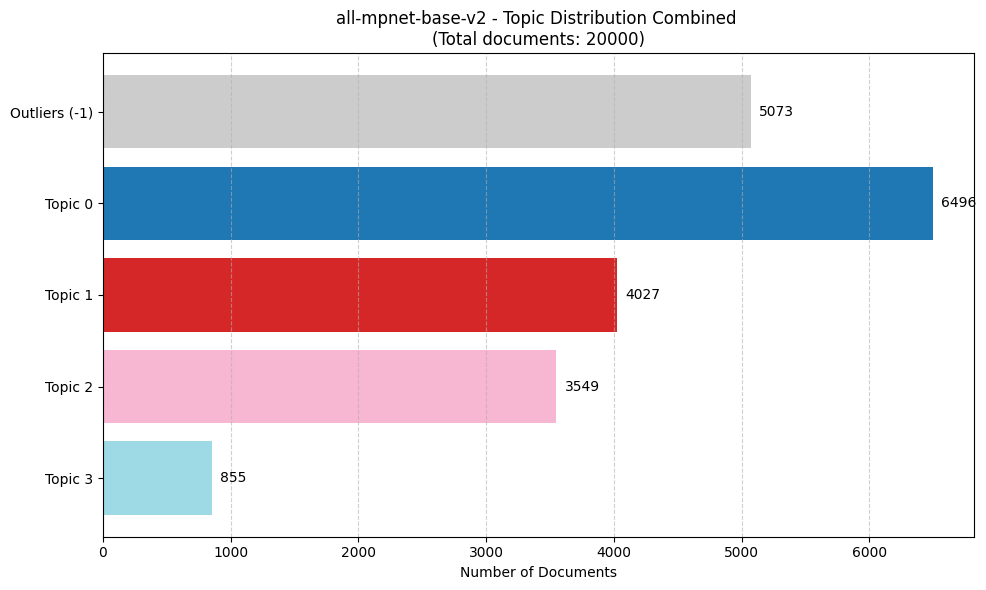

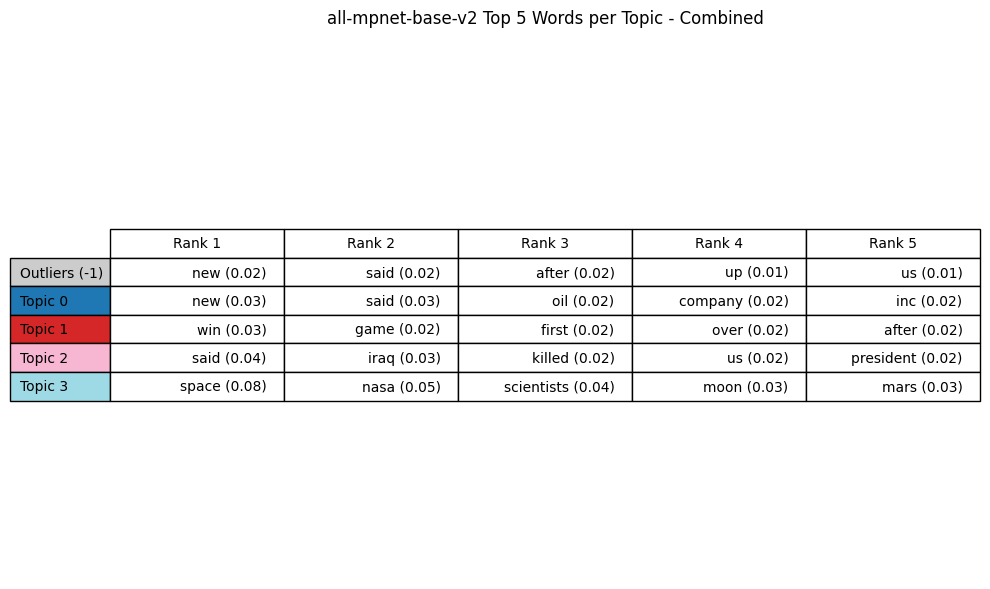

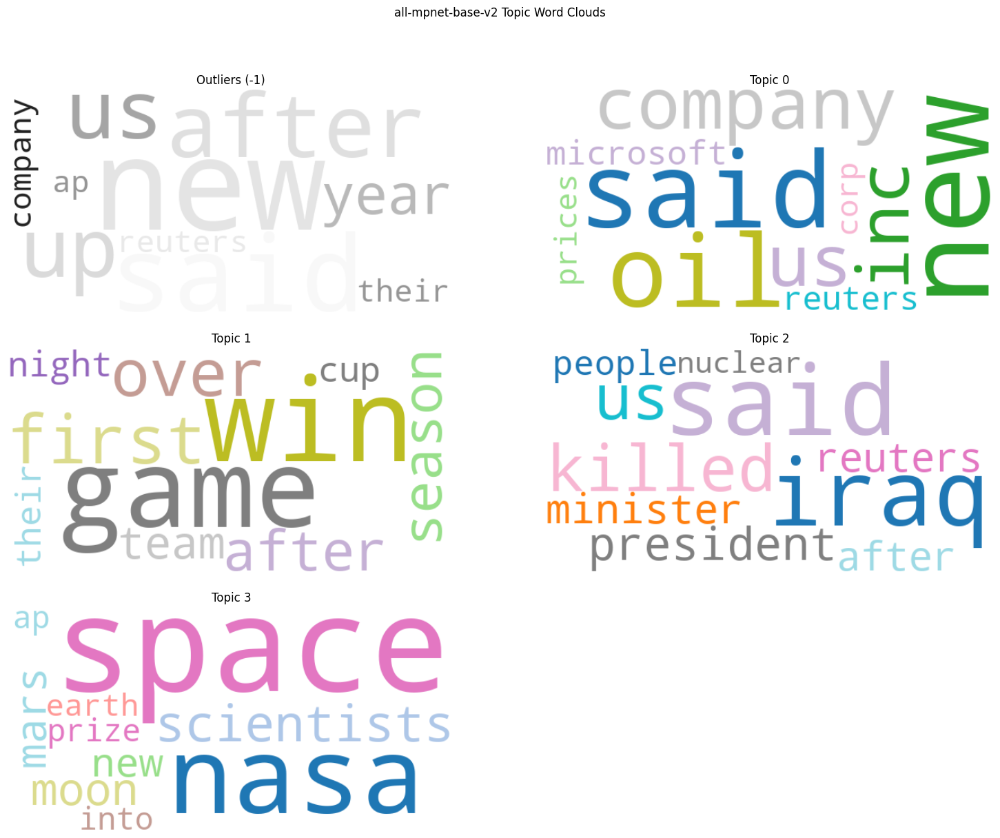

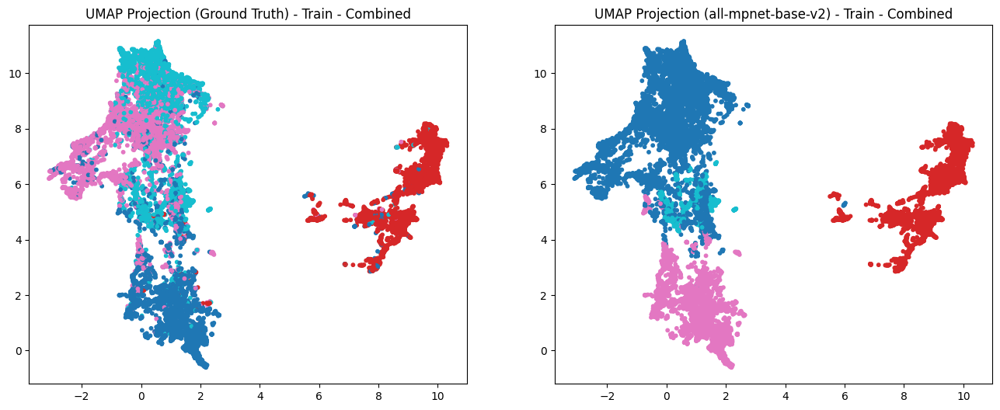

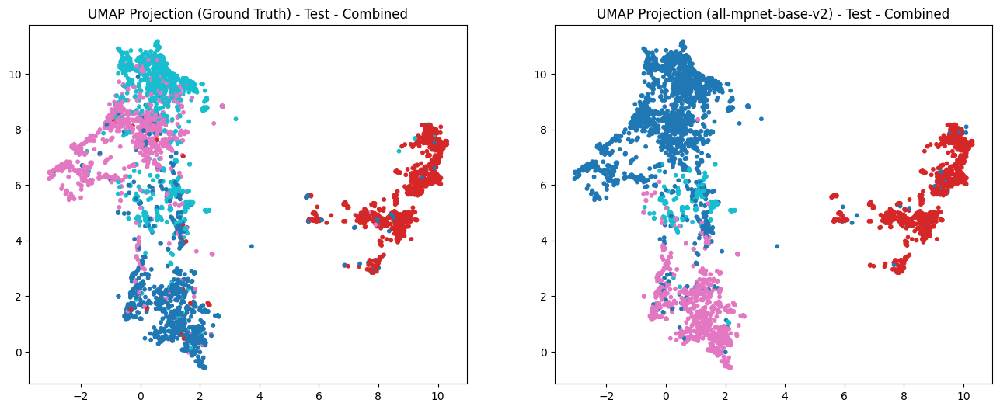


Top words per topic:
   Topic  Count                          Name  \
0     -1   5073          -1_new_said_after_up   
1      0   6496        0_new_said_oil_company   
2      1   4027         1_win_game_first_over   
3      2   3549         2_said_iraq_killed_us   
4      3    855  3_space_nasa_scientists_moon   

                                      Representation  \
0  [new, said, after, up, us, year, reuters, ap, ...   
1  [new, said, oil, company, inc, us, microsoft, ...   
2  [win, game, first, over, after, season, team, ...   
3  [said, iraq, killed, us, president, minister, ...   
4  [space, nasa, scientists, moon, mars, new, pri...   

                                 Representative_Docs  
0  [before-the-bell: supergen shares soar new yor...  
1  [stocks surge oil slumps new york (reuters) u....  
2  [yankees red sox ready rumble (sports network)...  
3  [21 killed fresh iraq violence baghdad, decemb...  
4  [international space station crew plans new mi...  

Topic 0 - Repre

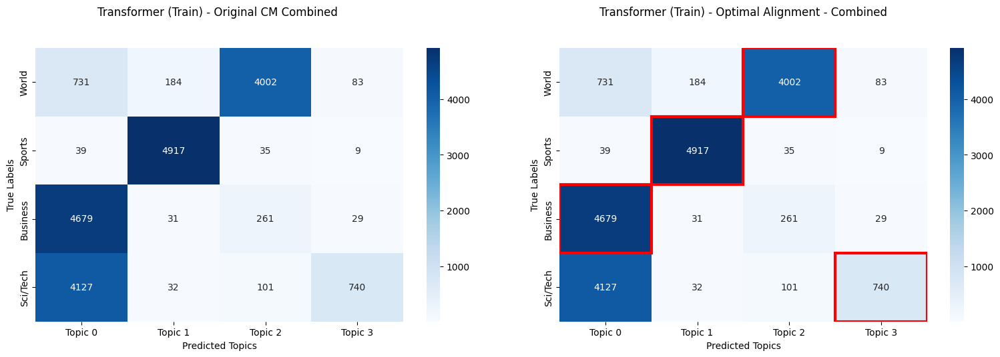


Transformer (Test) Performance:
ARI: 0.4827
NMI: 0.5356
Homogeneity: 0.4946
Completeness: 0.5839
V-Measure: 0.5356
Aligned_Accuracy: 0.6943
Macro_F1: 0.6591
Weighted_F1: 0.6591

Optimal Topic-Label Alignment:
Topic 2 -> World (751 samples)
Topic 1 -> Sports (945 samples)
Topic 0 -> Business (926 samples)
Topic 3 -> Sci/Tech (155 samples)


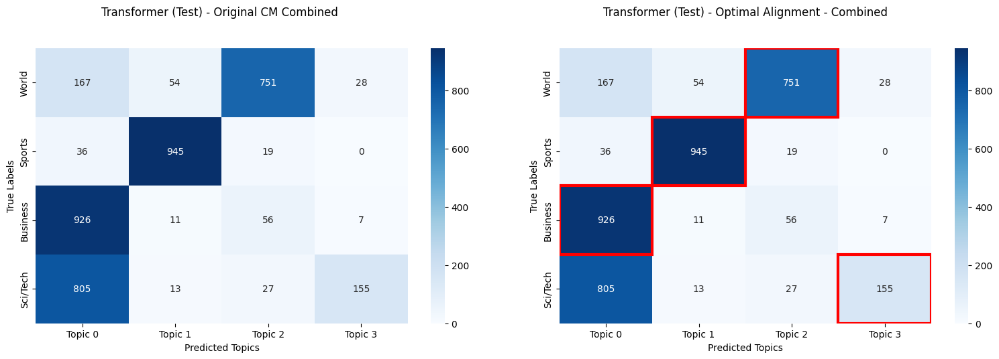

In [16]:
tm.run_transformer_topic_modeling()

2025-06-24 12:52:53,589 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training



=== Running Top2Vec for Exploration ===
Training Top2Vec on 20000 documents...


2025-06-24 12:52:54,281 - top2vec - INFO - Downloading universal-sentence-encoder model
INFO:top2vec:Downloading universal-sentence-encoder model
2025-06-24 12:52:57,944 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2025-06-24 12:52:58,956 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2025-06-24 12:53:05,765 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2025-06-24 12:53:06,083 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


Top2Vec found 411 topics
Before reduction: 411
After reduction: 4
Reduction result: [[125, 134, 114, 286, 231, 256, 243, 305, 88, 194, 176, 314, 177, 167, 408, 241, 223, 289, 44, 172, 387, 277, 247, 28, 52, 148, 207, 296, 19, 55, 76, 236, 318, 48, 64, 363, 410, 6, 80, 368, 5, 75, 185, 199, 1, 0, 47, 81, 251, 374, 34, 290, 95, 246, 133, 391, 29, 117, 210, 65, 111, 20, 115, 220, 108, 160, 211, 184, 102, 186, 164, 68, 118, 300, 159, 372, 390, 405, 151, 166, 232, 255, 216, 72, 165, 309, 86, 123, 201, 31, 74, 328, 264, 153, 145], [205, 155, 402, 287, 212, 229, 69, 42, 357, 71, 12, 334, 301, 291, 62, 171, 389, 2, 380, 43, 139, 9, 226, 144, 78, 219, 18, 113, 271, 324, 215, 367, 127, 87, 348, 224, 169, 196, 358, 146, 352, 105, 254, 319, 400, 24, 174, 39, 265, 349, 282, 280, 7, 239, 370, 299, 152, 182, 235, 278, 320, 93, 36, 263, 61, 49, 179, 41, 302, 317, 335, 189, 99, 404, 84, 161, 101, 137, 266, 313, 311, 338, 3, 310, 130, 396, 331, 240, 272, 4, 83, 218, 341, 274, 279, 157, 295, 276, 403, 11

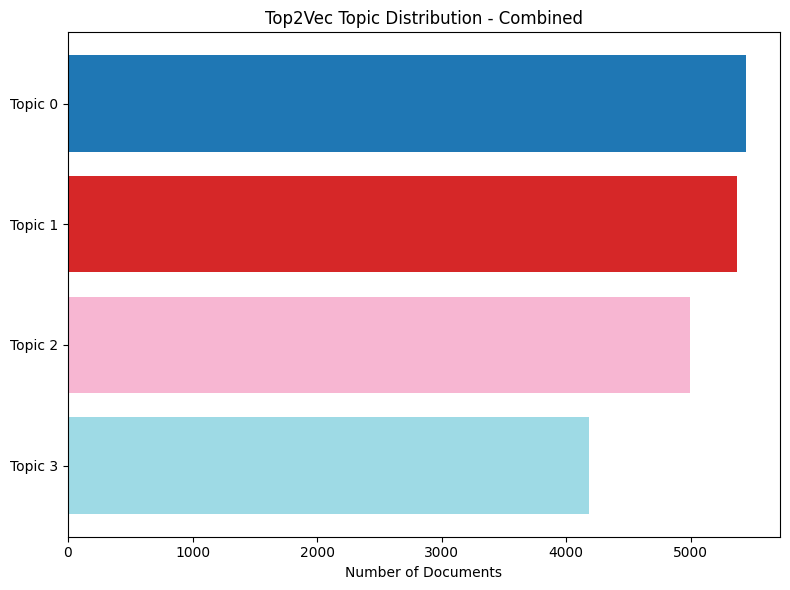

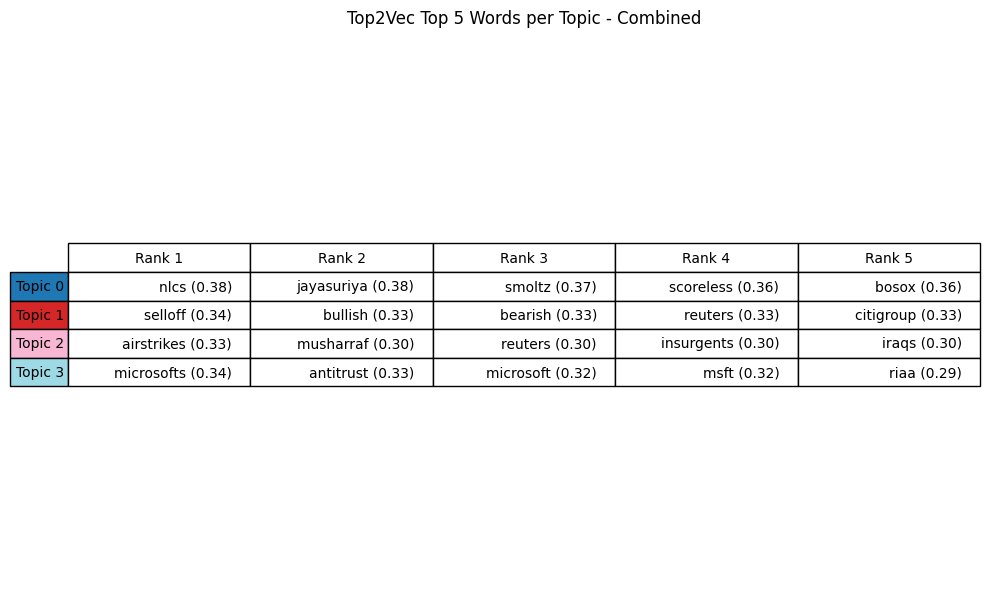

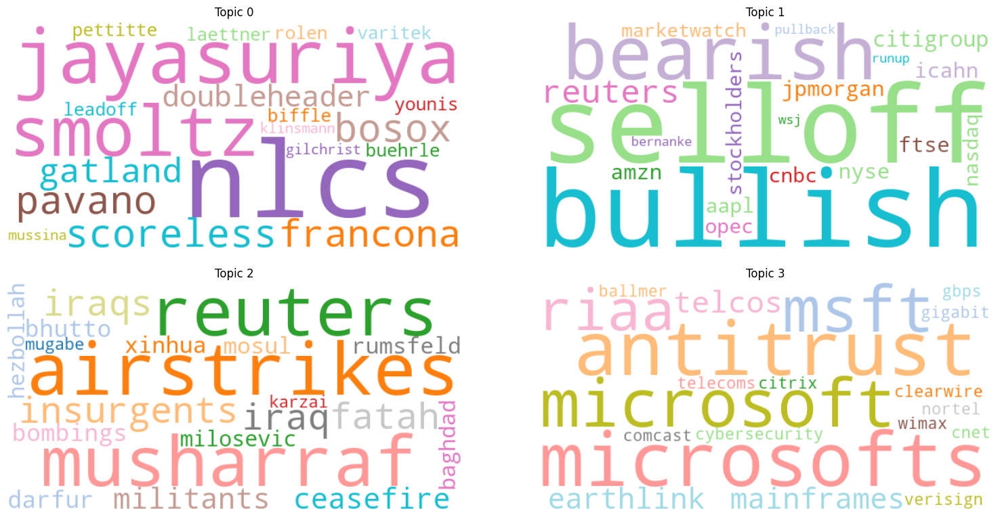


Top2Vec (Train) Performance:
ARI: 0.6271
NMI: 0.5994
Homogeneity: 0.5983
Completeness: 0.6006
V-Measure: 0.5994
Aligned_Accuracy: 0.8344
Macro_F1: 0.8322
Weighted_F1: 0.8322

Optimal Topic-Label Alignment:
Topic 2 -> World (4322 samples)
Topic 0 -> Sports (4884 samples)
Topic 1 -> Business (4007 samples)
Topic 3 -> Sci/Tech (3474 samples)


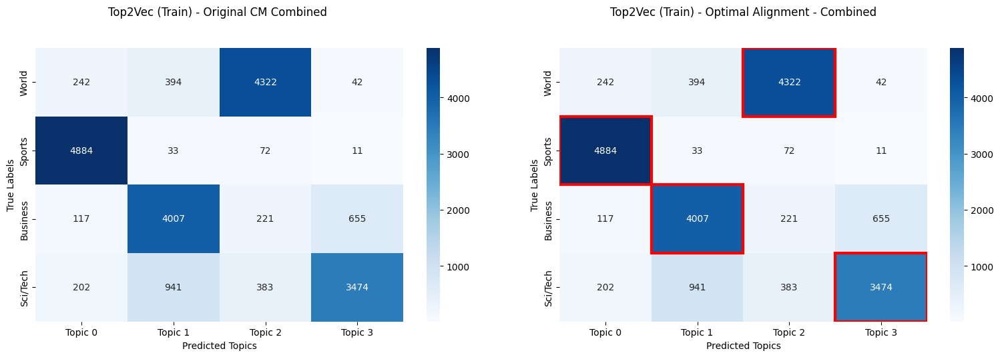


Evaluating on test set...

Top2Vec (Test) Performance:
ARI: 0.6005
NMI: 0.5858
Homogeneity: 0.5836
Completeness: 0.5881
V-Measure: 0.5858
Aligned_Accuracy: 0.8170
Macro_F1: 0.8148
Weighted_F1: 0.8148

Optimal Topic-Label Alignment:
Topic 2 -> World (875 samples)
Topic 0 -> Sports (965 samples)
Topic 1 -> Business (786 samples)
Topic 3 -> Sci/Tech (642 samples)


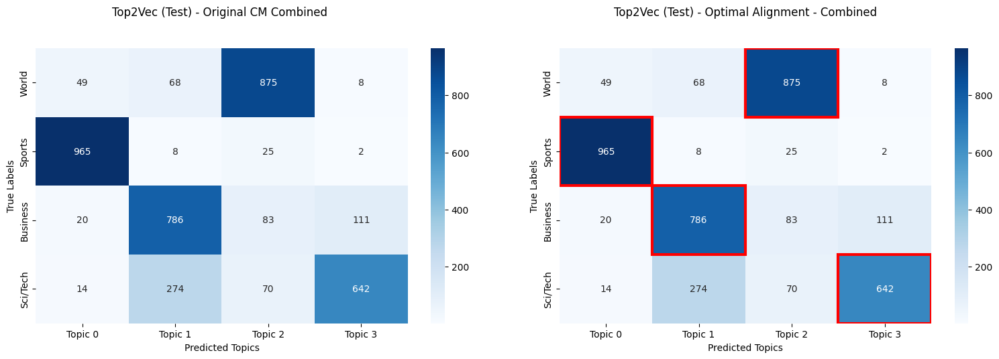


Test Set Assignment Quality:
Assigned documents: 4000/4000
Mean assignment score: 0.63
Median assignment score: 0.64


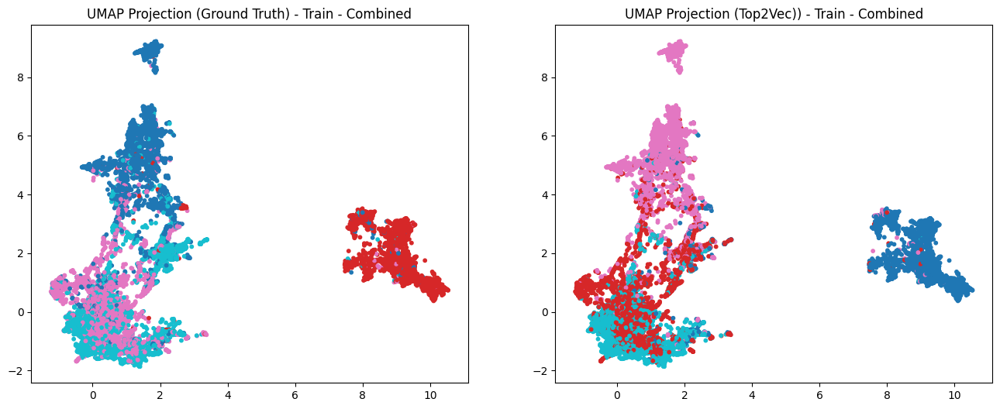

In [17]:
tm.run_top2vec()


=== Running Ensemble Methods ===
Ensembling 2 models: ['Transformer', 'Top2Vec']

Ensemble (Train) Performance:
ARI: 0.5402
NMI: 0.6069
Homogeneity: 0.5597
Completeness: 0.6628
V-Measure: 0.6069
Aligned_Accuracy: 0.7169
Macro_F1: 0.6784
Weighted_F1: 0.6784

Optimal Topic-Label Alignment:
Topic 2 -> World (4002 samples)
Topic 1 -> Sports (4917 samples)
Topic 0 -> Business (4679 samples)
Topic 3 -> Sci/Tech (740 samples)


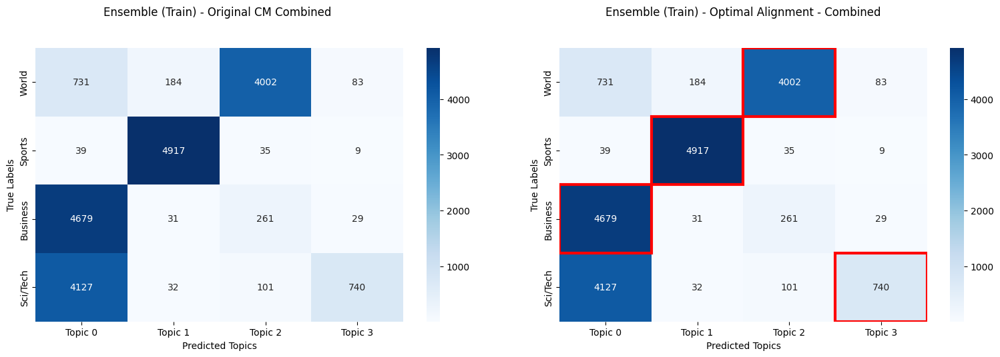


Ensemble (Test) Performance:
ARI: 0.4827
NMI: 0.5356
Homogeneity: 0.4946
Completeness: 0.5839
V-Measure: 0.5356
Aligned_Accuracy: 0.6943
Macro_F1: 0.6591
Weighted_F1: 0.6591

Optimal Topic-Label Alignment:
Topic 2 -> World (751 samples)
Topic 1 -> Sports (945 samples)
Topic 0 -> Business (926 samples)
Topic 3 -> Sci/Tech (155 samples)


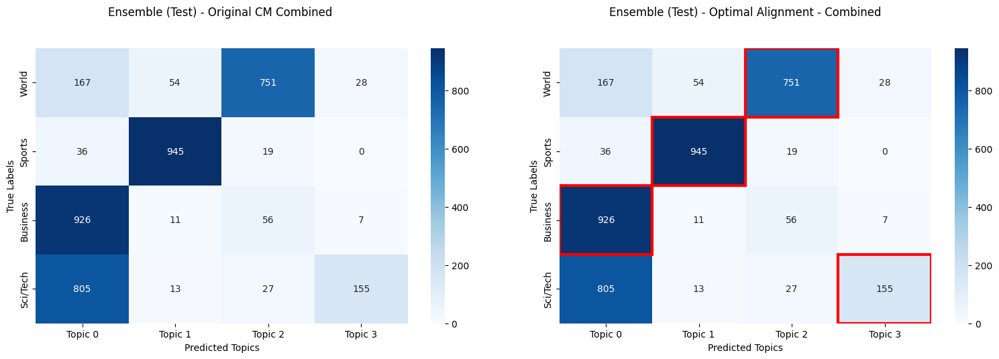

In [18]:
tm.run_ensemble_methods()


FINAL PERFORMANCE COMPARISON

Test Set Performance Comparison:
                 Model    ARI    NMI  Homogeneity  Completeness  V-Measure  Aligned_Accuracy  Macro_F1  Weighted_F1
BERT_all-MiniLM-L12-v2 0.4790 0.5031       0.4520        0.5672     0.5031            0.6637    0.5836       0.5836
BERT_all-mpnet-base-v2 0.4827 0.5356       0.4946        0.5839     0.5356            0.6942    0.6591       0.6591
               Top2Vec 0.6005 0.5858       0.5836        0.5881     0.5858            0.8170    0.8148       0.8148
              Ensemble 0.4827 0.5356       0.4946        0.5839     0.5356            0.6942    0.6591       0.6591

----------------------------------------
BEST PERFORMING MODELS:
----------------------------------------
ARI: Top2Vec (0.6005)
NMI: Top2Vec (0.5858)
Homogeneity: Top2Vec (0.5836)
Completeness: Top2Vec (0.5881)
V-Measure: Top2Vec (0.5858)
Aligned_Accuracy: Top2Vec (0.8170)


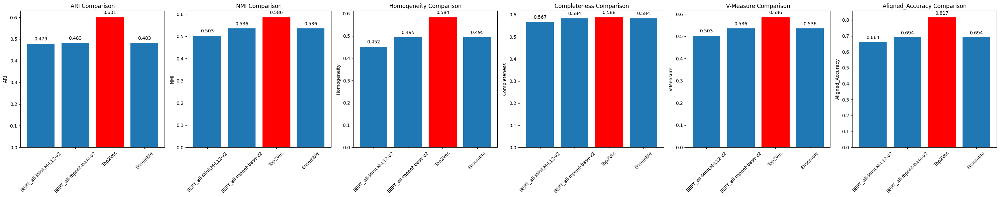

In [19]:
tm.generate_final_comparison()